In [3]:
import gym
import torch
import gym_nav
import numpy as np

import sys
sys.path.append('../')
from evaluation import *
from model_evaluation import *
from trajectories import *
from shortcut_analysis import *
from explore_analysis import *

from tqdm import tqdm
from umap import UMAP
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances

# Changes n steps after seeing the shortcut

In [2]:
def draw_trajectory(pos=None, angle=None, fig=None, ax=None, rew=None):
    '''Convert positions and angles into an image trajectory
    Adds a few extra details like where the start and goal reached locations are
    as well as adding increasing redness as the agent spends time in one spot rotating
    without forward movement
    
    rew: optionaly pass rewards for each step and use this to color
        blue steps rather than using lengh based method which we used previously
        for fixed goal task
    '''
    if fig == None and ax == None:
        fig, ax = pplt.subplots()
    stopped = 0
    last_p = np.zeros(2)
    for i, (p, a) in enumerate(zip(pos, angle)):
        redness = max(0, 1-stopped*0.1)
        color = [1, redness, redness, 1]
        draw_character(p, a[0], ax=ax, color=color)

        if (p == last_p).all():
            stopped += 1
        else:
            stopped = 0
        last_p = p

    #redraw first step
    draw_character(pos[0], angle[0][0], color=[0, 1, 0, 1], size=18, ax=ax)
    
    #draw last step assuming it is a success if number of steps is less than 202
    #  for the fixed goal task
    if rew is not None:
        rew_steps = np.where(rew == 1)[0]
        for step in rew_steps:
            draw_character(pos[step], angle[step][0], color=[0, 1, 1, 1], size=18, ax=ax)
    elif len(pos) < 202:
        draw_character(pos[-1], angle[-1][0], color=[0, 1, 1, 1], size=18, ax=ax)
    ax.format(xlim=[0, 300], ylim=[0, 300])
    
    return fig, ax

In [39]:
env = gym.make('ShortcutNav-v0', character_reset_pos=3)

In [3]:
model, obs_rms = load_chk(f'shortcutnav_fcp0.4reset3batch64', trial=0, chk=400)

seed = 1

res1 = test_shortcut_activations(model, obs_rms, seed=1, shortcut_probability=0,
                         test_only=True, skip_activs=False, data_callback=shortcut_visdata_callback)
res2 = test_shortcut_activations(model, obs_rms, seed=1, shortcut_probability=1,
                         test_only=True, skip_activs=False, data_callback=shortcut_visdata_callback)


KeyboardInterrupt



**4 wall colors**

There seems to be somewhat consistent splitting of population activations along 1/2 PCA dimensions in p=0.4 agents, usually on the 5th or 6th PCA. This might make sense as we expect that the majority of population activity is not reserved for the distinction between shortcut and entrance

It would be interesting to then look at which nodes contribute to those split PCAs

In [4]:
model, obs_rms = load_chk(f'shortcutnav_fcp0.1reset3batch64', trial=2, chk=400)

res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 0.5},
                   seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                       num_episodes=100)
                       

In [36]:
'''Collect up to first+nth step of seeing shortcut
where first is the first step seeing the shortcut'''
n = 5 #number of steps after shortcut seen to consider
num_eps = 100

activs = ep_stack_activations(res)

# activations
vis_a = []
a0 = []
a1 = [] #no shortcut avail
a2 = [] #shortcut avail

act0 = []
act1 = []
act2 = []
for ep in range(num_eps):
    a = activs[ep]['shared_activations'][1]
    vis = res['data']['shortcut_vis'][ep]
    acts = res['actions'][ep]
    first = np.argmax(vis)
    
    vis_a.append(a[:first+n])
    
    if res['data']['shortcut'][ep][0]:
        a2.append(a[first:first+n])
        act2.append(acts[first:first+n])
    else:
        a1.append(a[first:first+n])
        act1.append(acts[first:first+n])
    a0.append(a[:first])
    act0.append(acts[:first])
vis_a = torch.vstack(vis_a)

pca = PCA()
a_pca = pca.fit_transform(vis_a)
a0 = pca.transform(torch.vstack(a0))
a1 = pca.transform(torch.vstack(a1))
a2 = pca.transform(torch.vstack(a2))

act0 = np.vstack(act0).squeeze()
act1 = np.vstack(act1).squeeze()
act2 = np.vstack(act2).squeeze()
# fig, ax = pplt.subplots(nrows=2, ncols=3)
# for i in range(6):
#     ax[i].scatter(a0[:, i*2], a0[:, i*2+1], alpha=0.1)
#     ax[i].scatter(a1[:, i*2], a1[:, i*2+1], alpha=0.3)
#     ax[i].scatter(a2[:, i*2], a2[:, i*2+1], alpha=0.3)


(array([ 45.,   0.,   0.,   0.,   0., 205.,   0.,   0.,   0.,  25.]),
 array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2, 1.4, 1.6, 1.8, 2. ]),
 <BarContainer object of 10 artists>)

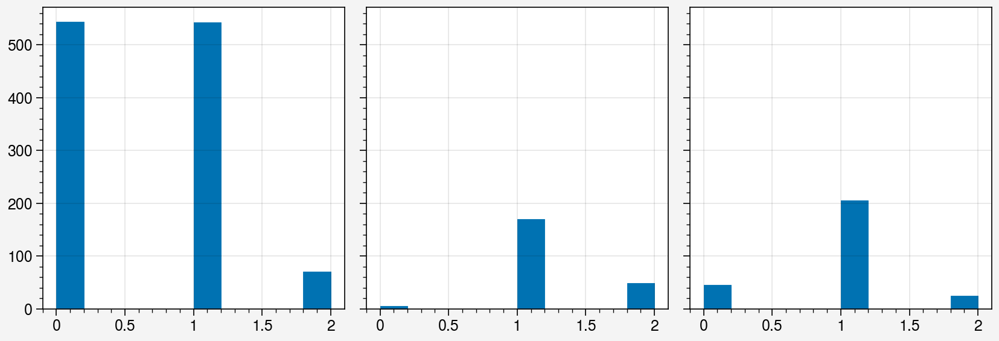

In [38]:
fig, ax = pplt.subplots(ncols=3)
ax[0].hist(act0)
ax[1].hist(act1)
ax[2].hist(act2)

<a list of 10 PolyCollection objects>

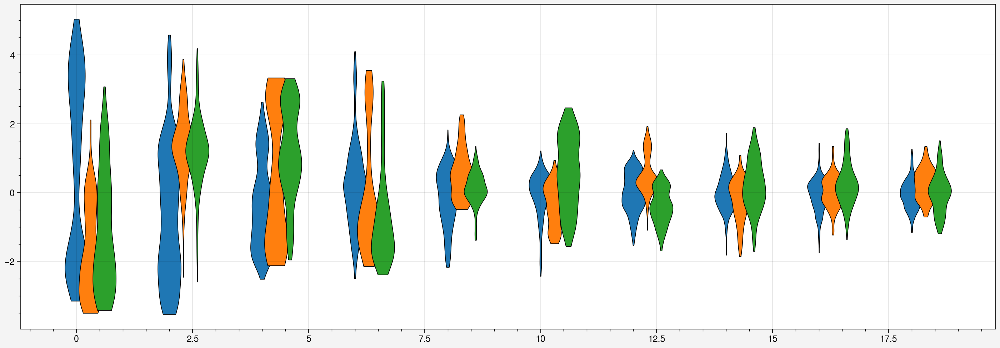

In [10]:
fig, ax = pplt.subplots(refaspect=3, figwidth=14)
m = 10

ax.violin(np.arange(m)*2, a0[:, :m], fc=rgb_colors[0])
ax.violin(np.arange(m)*2+0.3, a1[:, :m], fc=rgb_colors[1])
ax.violin(np.arange(m)*2+0.6, a2[:, :m], fc=rgb_colors[2])

In [19]:
from scipy.stats import ttest_ind, wasserstein_distance

In [ ]:
p

torch.Size([1657, 64])

<a list of 1 PolyCollection objects>

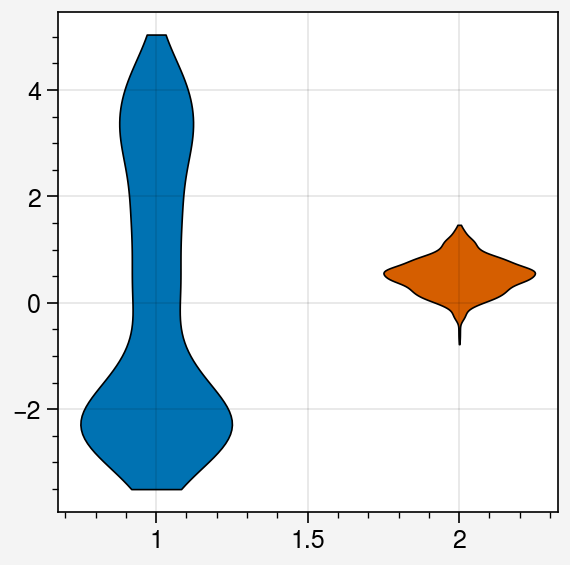

In [49]:
fig, ax = pplt.subplots()
ax.violin(1, a_pca[:, 0])
ax.violin(2, np.matmul(vis_a, pca.components_)[:, 0])

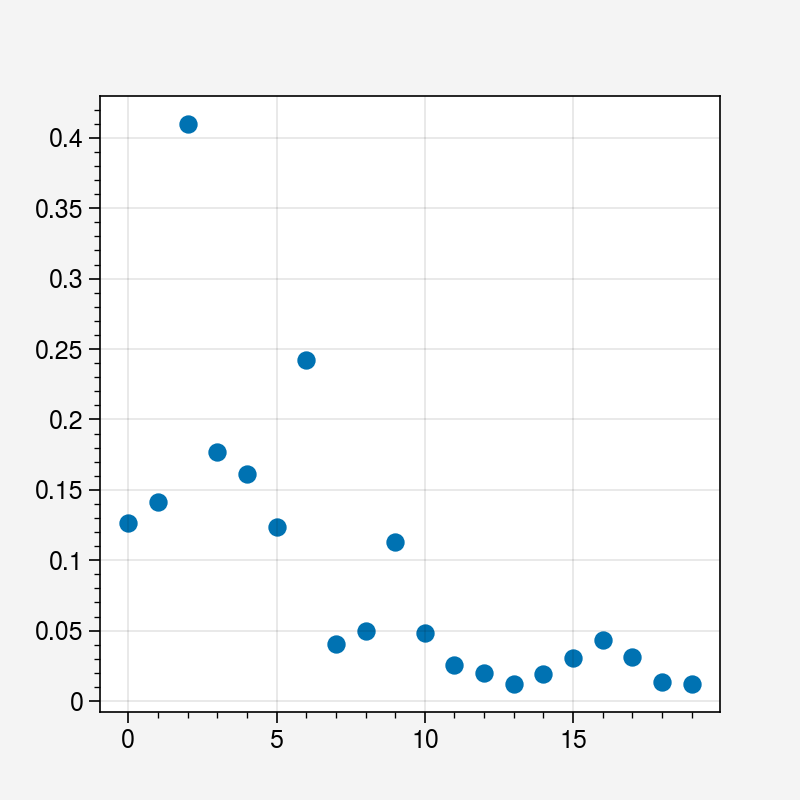

In [29]:
wasserstein_distance(a1[:, 0], a2[:, 0])
m = 20
dists = []
for i in range(m):
    dist = wasserstein_distance(a1[:, i], a2[:, i],
                               np.abs(1/a1[:, i]), np.abs(1/a2[:, i]))
    dists.append(dist)

plt.scatter(np.arange(m), dists)

In [65]:

# Zero everything except for the highest Wasserstein pca dim which is 2 here
zero = np.full(64, True)
zero[2] = False

rev_a0 = a0.copy()
rev_a0[:, zero] = 0
rev_a0 = pca.inverse_transform(rev_a0)

rev_a1 = a1.copy()
rev_a1[:, zero] = 0
rev_a1 = pca.inverse_transform(rev_a1)

rev_a2 = a2.copy()
rev_a2[:, zero] = 0
rev_a2 = pca.inverse_transform(rev_a2)


<a list of 11 PolyCollection objects>

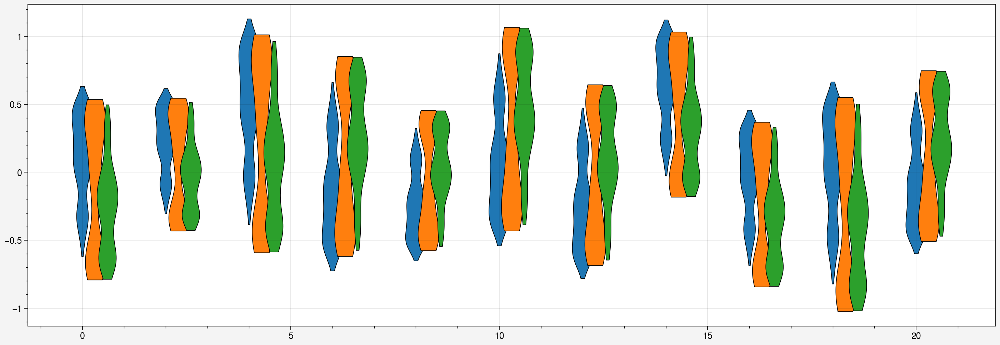

In [74]:
fig, ax = pplt.subplots(refaspect=3, figwidth=14)
m = idxs.sum()

ax.violin(np.arange(m)*2, rev_a0[:, idxs], fc=rgb_colors[0])
ax.violin(np.arange(m)*2+0.3, rev_a1[:, idxs], fc=rgb_colors[1])
ax.violin(np.arange(m)*2+0.6, rev_a2[:, idxs], fc=rgb_colors[2])

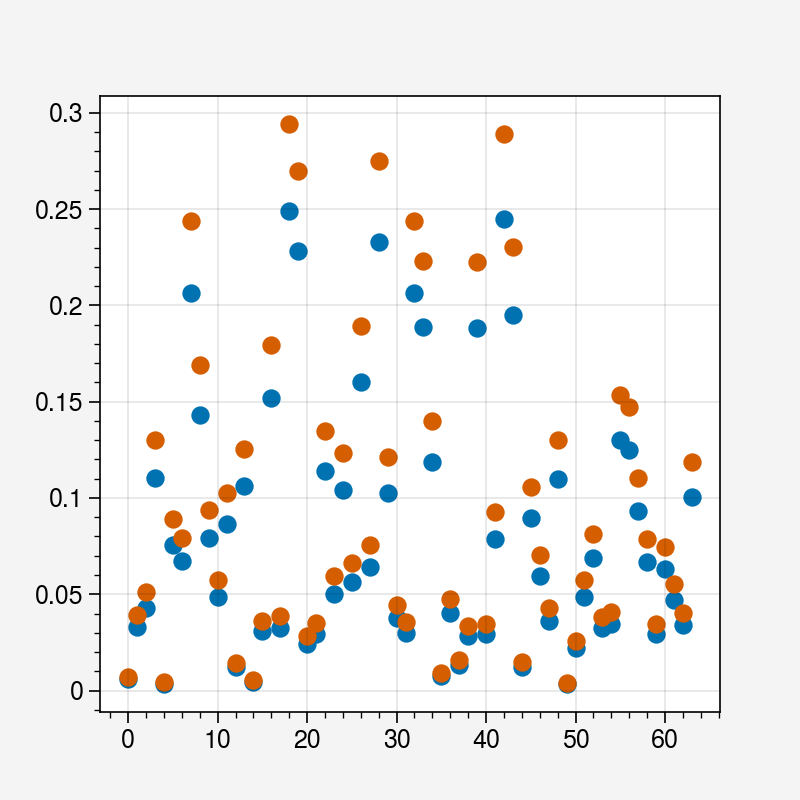

In [94]:
wasserstein_distance(a1[:, 0], a2[:, 0])
m = 64
dists = []
for i in range(m):
    dist = wasserstein_distance(rev_a1[:, i], rev_a2[:, i])
    dists.append(dist)
idxs = np.array(dists) > 0.15
plt.scatter(np.arange(m), dists)
plt.scatter(np.arange(64), np.abs(pca.components_[2]))

In [78]:
idx = np.argmax(dists)

In [95]:
idx = np.argmin(dists)

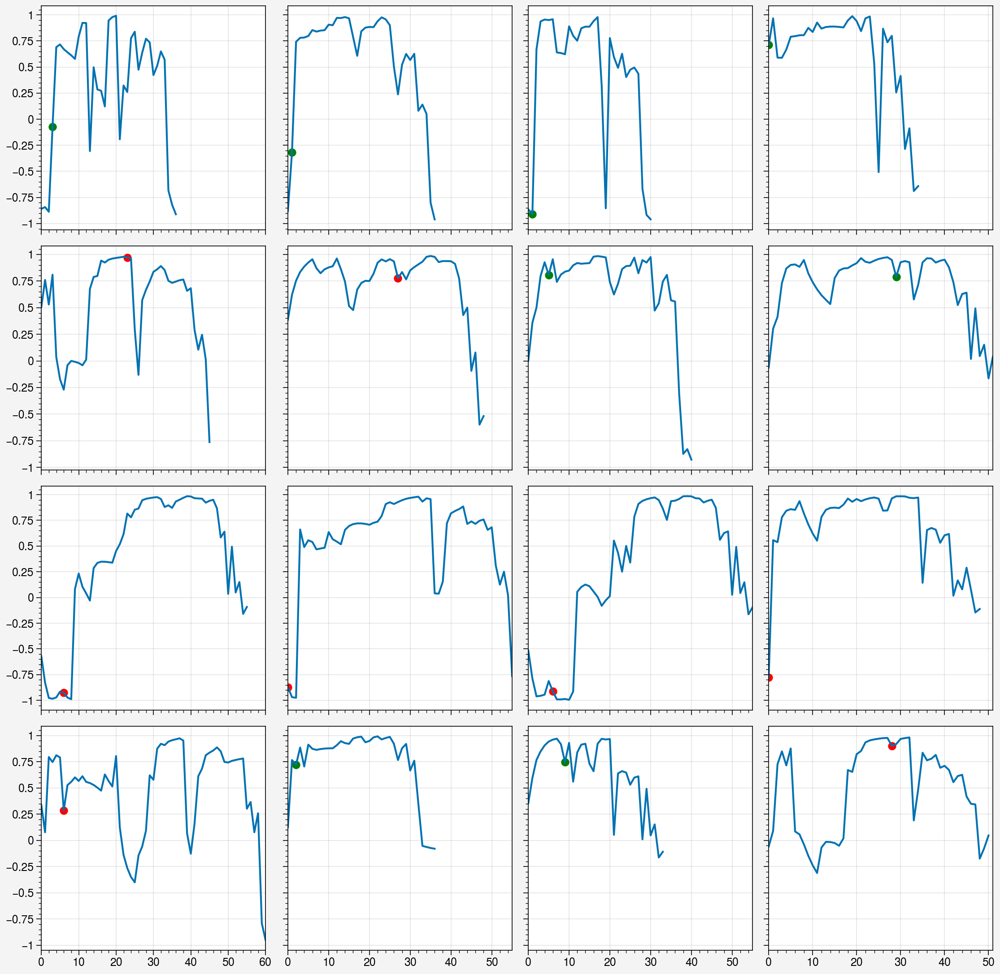

In [96]:
fig, ax = pplt.subplots(nrows=4, ncols=4)
for ep in range(16):
    a = activs[ep]['shared_activations'][1][:, idx]
    vis = res['data']['shortcut_vis'][ep]
    first = np.argmax(vis)
    ax[ep].plot(np.arange(len(a)), a)

    if res['data']['shortcut'][ep][0]:
        ax[ep].scatter([first], [a[first]], color='green')
    else:
        ax[ep].scatter([first], [a[first]], color='red')
        


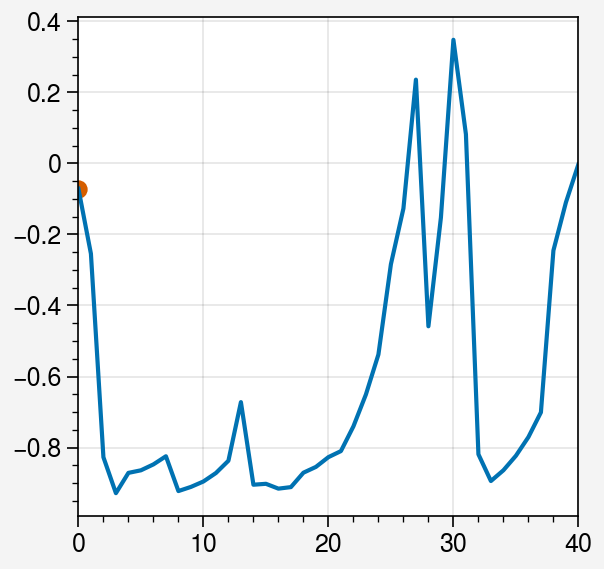

In [64]:
ax.violin(np.arange(m)*2, a0[:, :m], fc=rgb_colors[0])
ax.violin(np.arange(m)*2+0.3, a1[:, :m], fc=rgb_colors[1])
ax.violin(np.arange(m)*2+0.6, a2[:, :m], fc=rgb_colors[2])

array([[ 0.61395673,  0.23247333,  0.13160507, ..., -0.09968667,
         0.16692093, -0.14081267],
       [ 0.61410437,  0.23330816,  0.13268817, ..., -0.09850616,
         0.16606517, -0.14333336],
       [ 0.62055662,  0.26979058,  0.18002028, ..., -0.04691699,
         0.1286677 , -0.25348945],
       ...,
       [ 0.59037437,  0.0991336 , -0.04138927, ..., -0.28824016,
         0.3036051 ,  0.26179726],
       [ 0.59014722,  0.09784924, -0.0430556 , ..., -0.29005635,
         0.30492168,  0.2656753 ],
       [ 0.59032206,  0.09883784, -0.04177299, ..., -0.28865839,
         0.30390828,  0.26269029]])

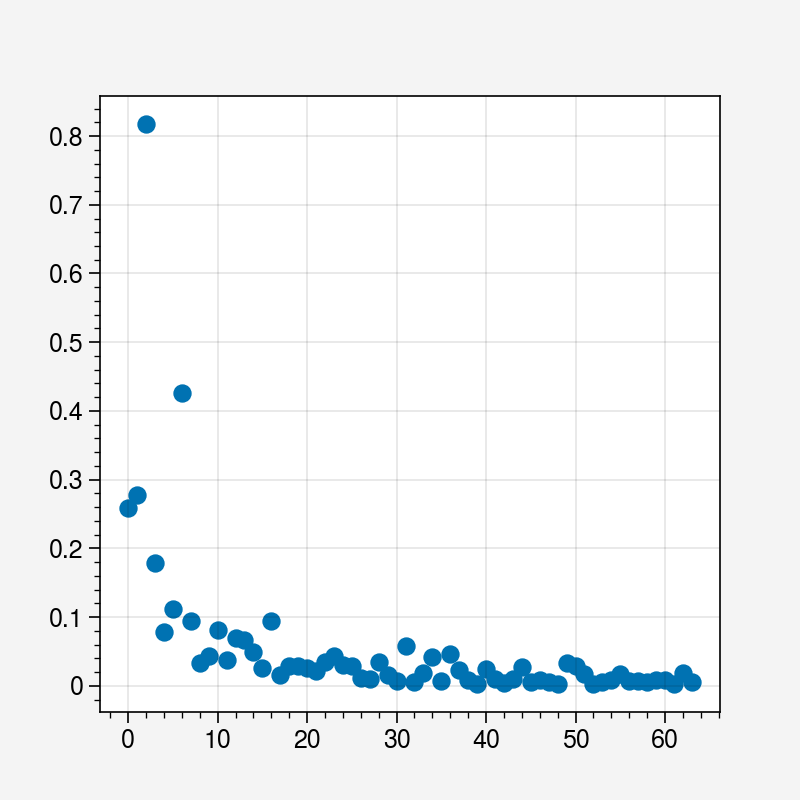

In [98]:
model, obs_rms = load_chk(f'shortcutnav_fcp0.4reset3batch64', trial=0, chk=400)

res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 0.5},
                   seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                       num_episodes=100)
                       

'''Collect up to first+nth step of seeing shortcut
where first is the first step seeing the shortcut'''
n = 5 #number of steps after shortcut seen to consider
num_eps = 100

activs = ep_stack_activations(res)

# activations
vis_a = []
a0 = []
a1 = [] #no shortcut avail
a2 = [] #shortcut avail

act0 = []
act1 = []
act2 = []
for ep in range(num_eps):
    a = activs[ep]['shared_activations'][1]
    vis = res['data']['shortcut_vis'][ep]
    acts = res['actions'][ep]
    first = np.argmax(vis)
    
    vis_a.append(a[:first+n])
    
    if res['data']['shortcut'][ep][0]:
        a2.append(a[first:first+n])
        act2.append(acts[first:first+n])
    else:
        a1.append(a[first:first+n])
        act1.append(acts[first:first+n])
    a0.append(a[:first])
    act0.append(acts[:first])
vis_a = torch.vstack(vis_a)

pca = PCA()
a_pca = pca.fit_transform(vis_a)
a0 = pca.transform(torch.vstack(a0))
a1 = pca.transform(torch.vstack(a1))
a2 = pca.transform(torch.vstack(a2))

act0 = np.vstack(act0).squeeze()
act1 = np.vstack(act1).squeeze()
act2 = np.vstack(act2).squeeze()
# fig, ax = pplt.subplots(nrows=2, ncols=3)
# for i in range(6):
#     ax[i].scatter(a0[:, i*2], a0[:, i*2+1], alpha=0.1)
#     ax[i].scatter(a1[:, i*2], a1[:, i*2+1], alpha=0.3)
#     ax[i].scatter(a2[:, i*2], a2[:, i*2+1], alpha=0.3)


m = 64
dists = []
for i in range(m):
    dist = wasserstein_distance(a1[:, i], a2[:, i],
                               np.abs(1/a1[:, i]), np.abs(1/a2[:, i]))
    dists.append(dist)
plt.scatter(np.arange(m), dists)

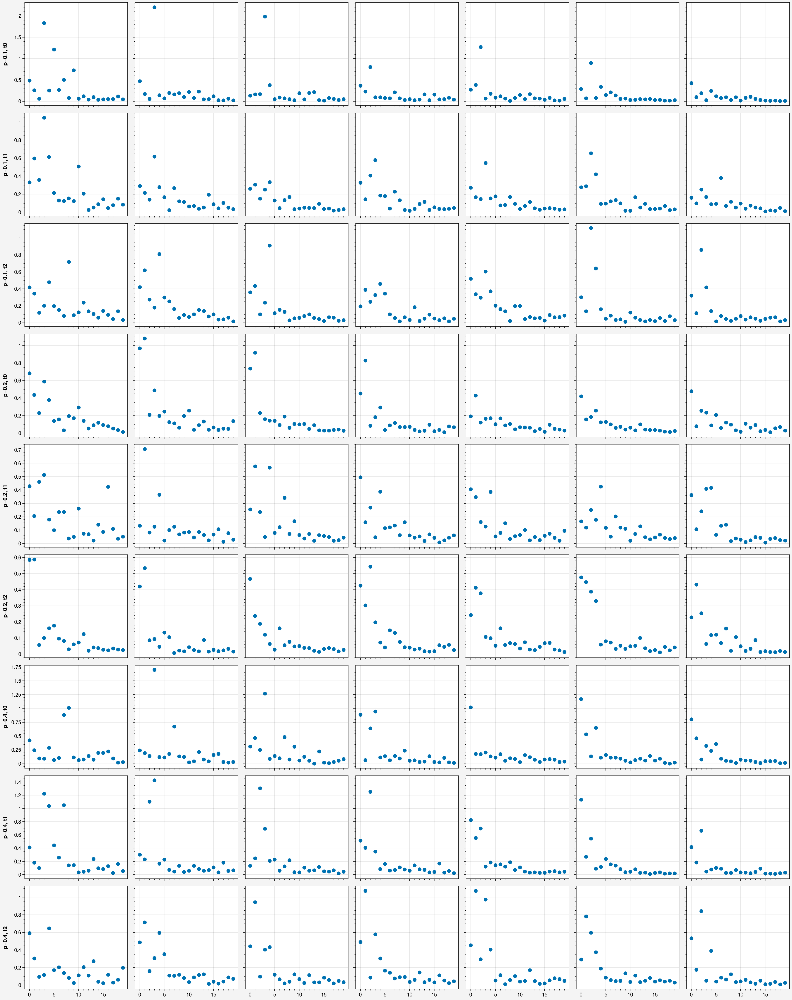

In [171]:
ns = [1, 2, 3, 4, 5, 7, 10]
fig, ax = pplt.subplots(nrows=9, ncols=len(ns))
leftlabels = []
for x, (p, t) in enumerate(itertools.product([0.1, 0.2, 0.4], range(3))):
    leftlabels.append(f'p={p}, t{t}')

    # model, obs_rms = load_chk(f'shortcutnav_fcp0.4reset3batch64', trial=0, chk=400)
    model, obs_rms = load_chk(f'shortcut_wc1.5p{p}', subdir='shortcut_wc', trial=t, chk=460)

    res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                           env_kwargs={'character_reset_pos': 3,
                                      'shortcut_probability': 0.5,
                                      'wall_colors': 1.5},
                       seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                           num_episodes=100)

    '''Collect up to first+nth step of seeing shortcut
    where first is the first step seeing the shortcut'''
    for j, n in enumerate(ns):
        num_eps = 100

        activs = ep_stack_activations(res)

        # activations
        vis_a = []
        a0 = []
        a1 = [] #no shortcut avail
        a2 = [] #shortcut avail

        act0 = []
        act1 = []
        act2 = []
        for ep in range(num_eps):
            a = activs[ep]['shared_activations'][1]
            vis = res['data']['shortcut_vis'][ep]
            acts = res['actions'][ep]
            first = np.argmax(vis)

            vis_a.append(a[:first+n])

            if res['data']['shortcut'][ep][0]:
                a2.append(a[first:first+n])
                act2.append(acts[first:first+n])
            else:
                a1.append(a[first:first+n])
                act1.append(acts[first:first+n])
            a0.append(a[:first])
            act0.append(acts[:first])
        vis_a = torch.vstack(vis_a)

        pca = PCA()
        a_pca = pca.fit_transform(vis_a)
        a0 = pca.transform(torch.vstack(a0))
        a1 = pca.transform(torch.vstack(a1))
        a2 = pca.transform(torch.vstack(a2))

        act0 = np.vstack(act0).squeeze()
        act1 = np.vstack(act1).squeeze()
        act2 = np.vstack(act2).squeeze()
        # fig, ax = pplt.subplots(nrows=2, ncols=3)
        # for i in range(6):
        #     ax[i].scatter(a0[:, i*2], a0[:, i*2+1], alpha=0.1)
        #     ax[i].scatter(a1[:, i*2], a1[:, i*2+1], alpha=0.3)
        #     ax[i].scatter(a2[:, i*2], a2[:, i*2+1], alpha=0.3)


        m = 20
        dists = []
        for i in range(m):
            dist = wasserstein_distance(a1[:, i], a2[:, i],
                                       np.abs(1/a1[:, i]), np.abs(1/a2[:, i]))
            dists.append(dist)
        ax[x, j].scatter(np.arange(m), dists)
        
ax.format(leftlabels=leftlabels)

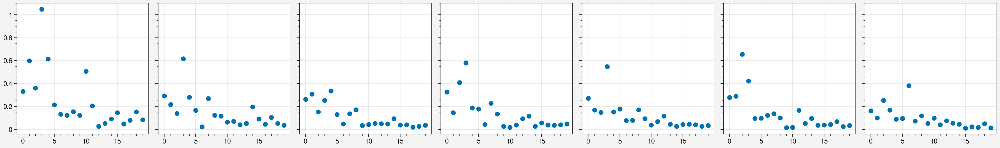

In [170]:
# model, obs_rms = load_chk(f'shortcutnav_fcp0.4reset3batch64', trial=0, chk=400)
model, obs_rms = load_chk(f'shortcut_wc1.5p0.1', subdir='shortcut_wc', trial=1, chk=460)

res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 0.5,
                                  'wall_colors': 1.5},
                   seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                       num_episodes=100)
                       
ns = [1, 2, 3, 4, 5, 7, 10]
fig, ax = pplt.subplots(ncols=len(ns))
'''Collect up to first+nth step of seeing shortcut
where first is the first step seeing the shortcut'''
for j, n in enumerate(ns):
    num_eps = 100

    activs = ep_stack_activations(res)

    # activations
    vis_a = []
    a0 = []
    a1 = [] #no shortcut avail
    a2 = [] #shortcut avail

    act0 = []
    act1 = []
    act2 = []
    for ep in range(num_eps):
        a = activs[ep]['shared_activations'][1]
        vis = res['data']['shortcut_vis'][ep]
        acts = res['actions'][ep]
        first = np.argmax(vis)

        vis_a.append(a[:first+n])

        if res['data']['shortcut'][ep][0]:
            a2.append(a[first:first+n])
            act2.append(acts[first:first+n])
        else:
            a1.append(a[first:first+n])
            act1.append(acts[first:first+n])
        a0.append(a[:first])
        act0.append(acts[:first])
    vis_a = torch.vstack(vis_a)

    pca = PCA()
    a_pca = pca.fit_transform(vis_a)
    a0 = pca.transform(torch.vstack(a0))
    a1 = pca.transform(torch.vstack(a1))
    a2 = pca.transform(torch.vstack(a2))

    act0 = np.vstack(act0).squeeze()
    act1 = np.vstack(act1).squeeze()
    act2 = np.vstack(act2).squeeze()
    # fig, ax = pplt.subplots(nrows=2, ncols=3)
    # for i in range(6):
    #     ax[i].scatter(a0[:, i*2], a0[:, i*2+1], alpha=0.1)
    #     ax[i].scatter(a1[:, i*2], a1[:, i*2+1], alpha=0.3)
    #     ax[i].scatter(a2[:, i*2], a2[:, i*2+1], alpha=0.3)


    m = 20
    dists = []
    for i in range(m):
        dist = wasserstein_distance(a1[:, i], a2[:, i],
                                   np.abs(1/a1[:, i]), np.abs(1/a2[:, i]))
        dists.append(dist)
    ax[j].scatter(np.arange(m), dists)

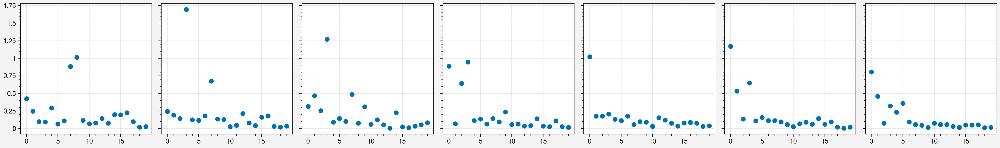

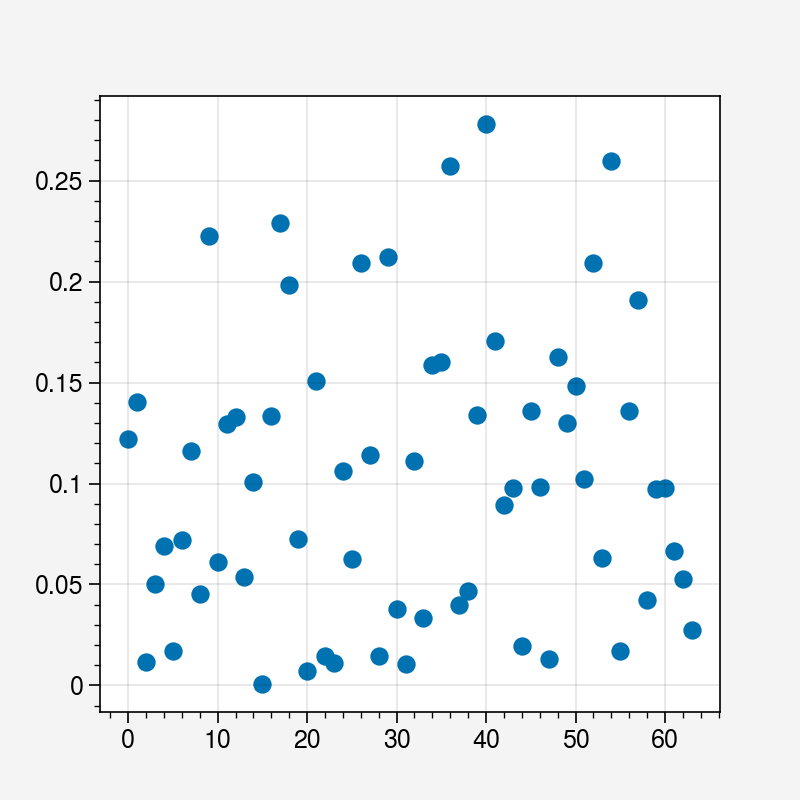

In [161]:
pca_idx = np.argmax(dists)
# pca_idx = 4
plt.scatter(np.arange(64), np.abs(pca.components_[pca_idx]))
node_idxs = np.abs(pca.components_[pca_idx]) > 0.15

<a list of 10 PolyCollection objects>

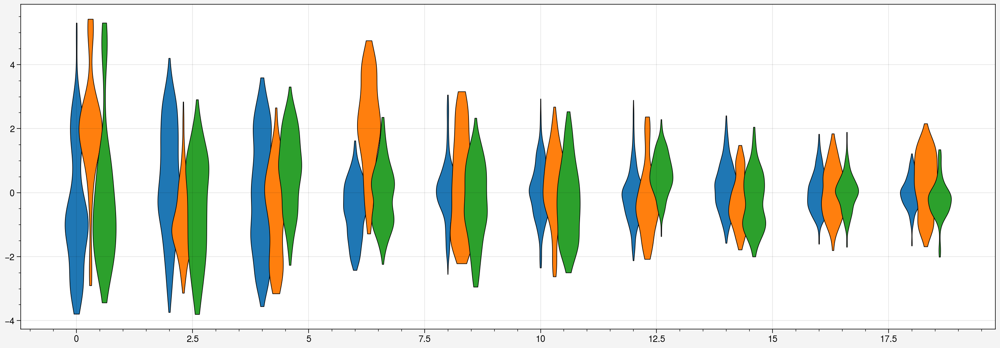

In [107]:
fig, ax = pplt.subplots(refaspect=3, figwidth=14)
m = 10

ax.violin(np.arange(m)*2, a0[:, :m], fc=rgb_colors[0])
ax.violin(np.arange(m)*2+0.3, a1[:, :m], fc=rgb_colors[1])
ax.violin(np.arange(m)*2+0.6, a2[:, :m], fc=rgb_colors[2])

In [102]:
all_shortcut_use_rates = pickle.load(open('data/shortcut/shortcut_wc1.5_userates', 'rb'))


(array([ 42.,   0.,   0.,   0.,   0.,  56.,   0.,   0.,   0., 177.]),
 array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2, 1.4, 1.6, 1.8, 2. ]),
 <BarContainer object of 10 artists>)

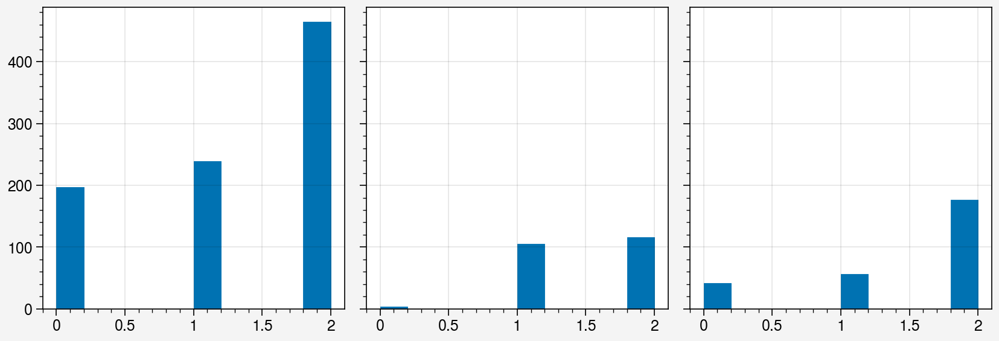

In [121]:
fig, ax = pplt.subplots(ncols=3)
ax[0].hist(act0)
ax[1].hist(act1)
ax[2].hist(act2)

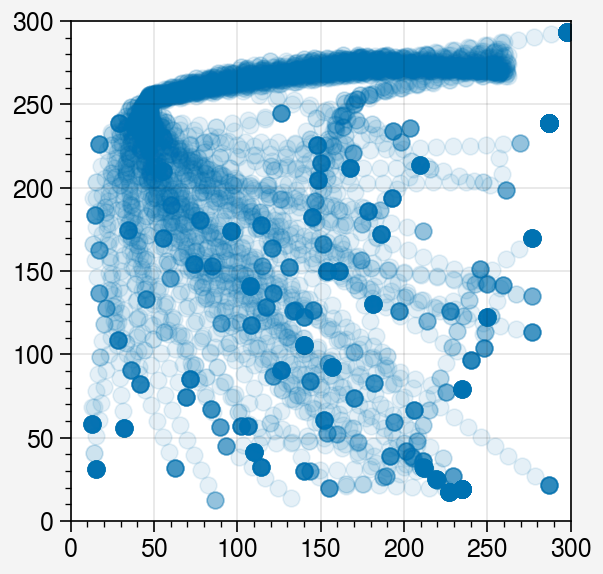

In [124]:
pos = np.vstack(res['data']['pos'])
angle = np.vstack(res['data']['angle']).reshape(-1)
fig, ax = pplt.subplots()

ax.scatter(pos[:, 0], pos[:, 1], alpha=0.1)
ax.format(xlim=[0, 300], ylim=[0, 300])

In [132]:
activ.shape

torch.Size([6881, 64])

In [154]:
activs = ep_stack_activations(res, True)
activ = activs['shared_activations'][1]

pca2 = PCA()
activ2d = pca2.fit_transform(activ[:, node_idxs])

# umap = UMAP(min_dist=0.75)
# activ2d = umap.fit_transform(activ[:, node_idxs])

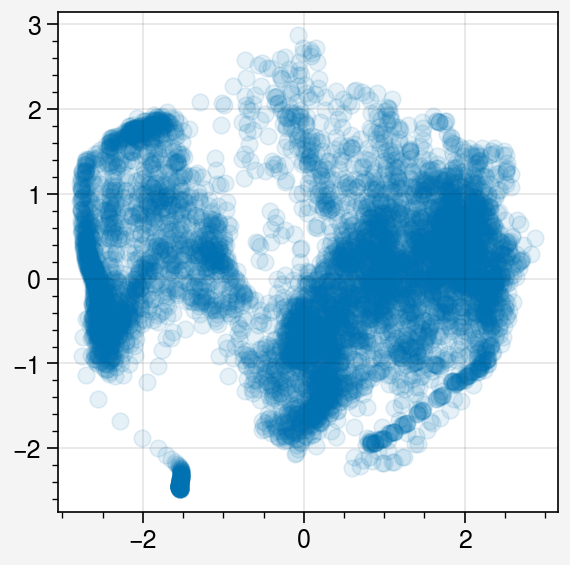

In [155]:
fig, ax = pplt.subplots()
ax.scatter(activ2d[:, 0], activ2d[:, 1], alpha=0.1)

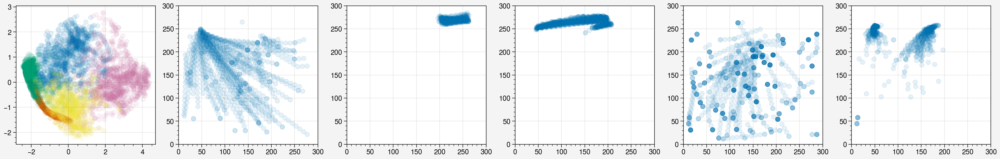

In [162]:
n = 5

activs = ep_stack_activations(res, True)
activ = activs['shared_activations'][1]

pca2 = PCA()
activ2d = pca2.fit_transform(activ[:, node_idxs])

pos = np.vstack(res['data']['pos'])

fig, ax = pplt.subplots(ncols=n+1, sharey=False)

km = KMeans(n_clusters=n)
# labels = km.fit_predict(activ2d[:, :2])
labels = km.fit_predict(activ)
for i in range(n):
    idxs = labels == i
    ax[0].scatter(activ2d[idxs, 0], activ2d[idxs, 1], alpha=0.1)
    ax[i+1].scatter(pos[idxs, 0], pos[idxs, 1], alpha=0.1)
    
ax[1:].format(xlim=[0, 300], ylim=[0, 300])

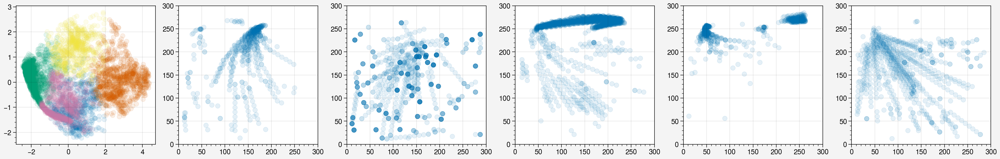

In [163]:
n = 5

activs = ep_stack_activations(res, True)
activ = activs['shared_activations'][1]

pca2 = PCA()
activ2d = pca2.fit_transform(activ[:, node_idxs])

pos = np.vstack(res['data']['pos'])

fig, ax = pplt.subplots(ncols=n+1, sharey=False)

km = KMeans(n_clusters=n)
# labels = km.fit_predict(activ2d[:, :2])
labels = km.fit_predict(activ[:, node_idxs])
for i in range(n):
    idxs = labels == i
    ax[0].scatter(activ2d[idxs, 0], activ2d[idxs, 1], alpha=0.1)
    ax[i+1].scatter(pos[idxs, 0], pos[idxs, 1], alpha=0.1)
    
ax[1:].format(xlim=[0, 300], ylim=[0, 300])

In [150]:
activs = ep_stack_activations(res, True)
# activ = activs['shared_activations'][1][:, node_idxs]
activ = activs['shared_activations'][1]

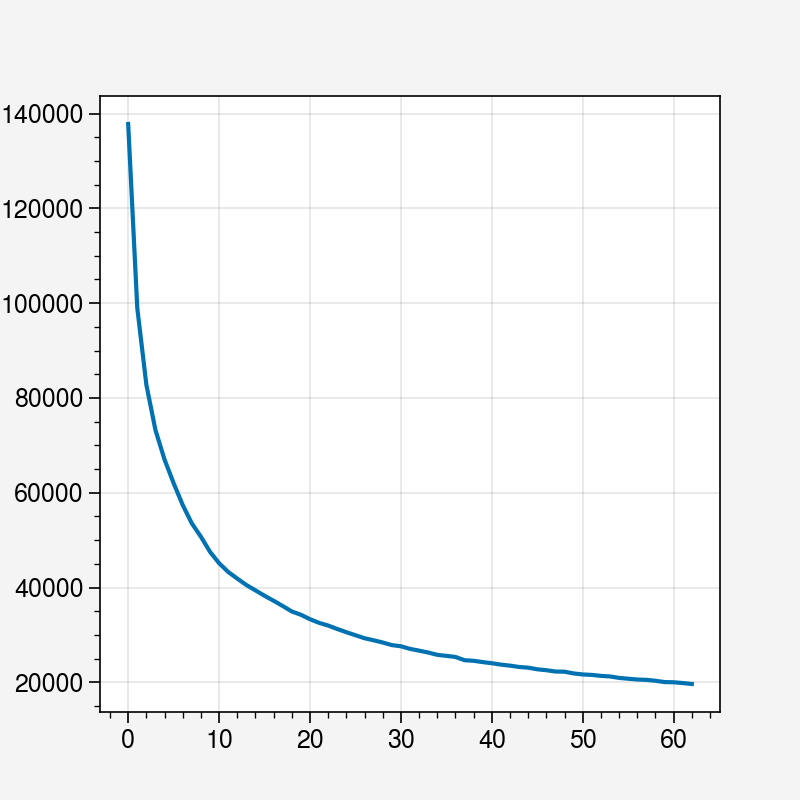

In [153]:
inertias = []
for i in range(1, activ.shape[1]):
    km = KMeans(n_clusters=i, random_state=0)
    labels = km.fit_predict(activ)
    inertias.append(km.inertia_)
plt.plot(inertias)

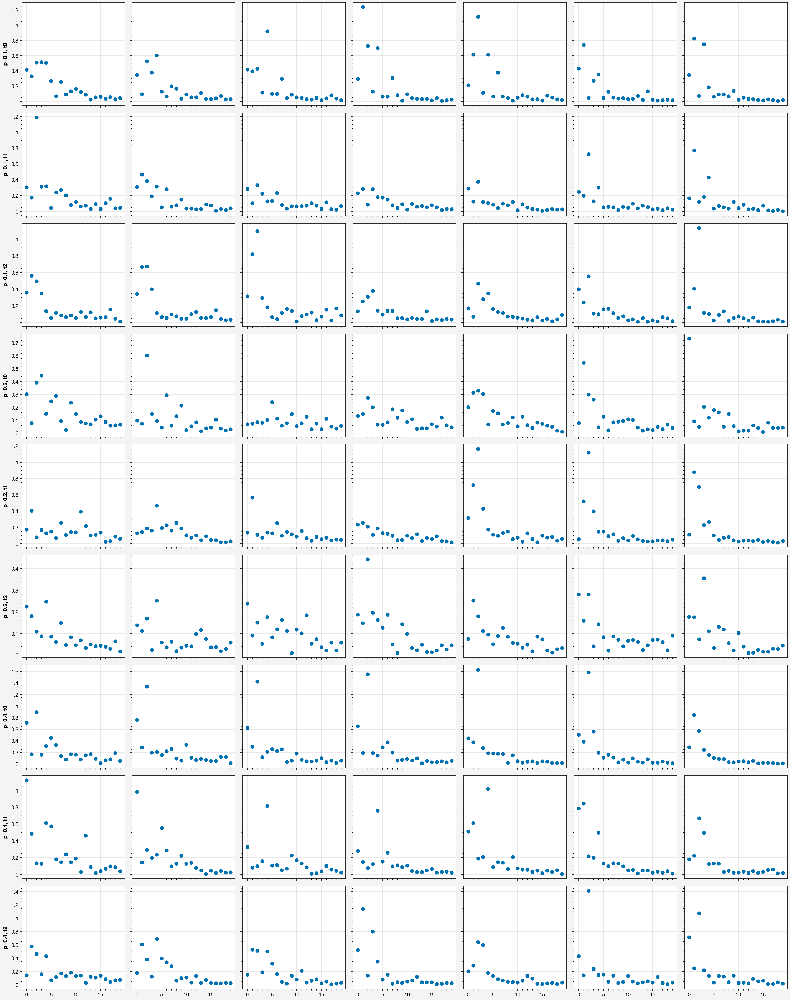

In [172]:
ns = [1, 2, 3, 4, 5, 7, 10]
fig, ax = pplt.subplots(nrows=9, ncols=len(ns))
leftlabels = []
for x, (p, t) in enumerate(itertools.product([0.1, 0.2, 0.4], range(3))):
    leftlabels.append(f'p={p}, t{t}')

    model, obs_rms = load_chk(f'shortcutnav_fcp{p}reset3batch64', trial=t, chk=460)
    # model, obs_rms = load_chk(f'shortcut_wc1.5p{p}', subdir='shortcut_wc', trial=t, chk=460)

    res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                           env_kwargs={'character_reset_pos': 3,
                                      'shortcut_probability': 0.5},
                       seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                           num_episodes=100)

    '''Collect up to first+nth step of seeing shortcut
    where first is the first step seeing the shortcut'''
    for j, n in enumerate(ns):
        num_eps = 100

        activs = ep_stack_activations(res)

        # activations
        vis_a = []
        a0 = []
        a1 = [] #no shortcut avail
        a2 = [] #shortcut avail

        act0 = []
        act1 = []
        act2 = []
        for ep in range(num_eps):
            a = activs[ep]['shared_activations'][1]
            vis = res['data']['shortcut_vis'][ep]
            acts = res['actions'][ep]
            first = np.argmax(vis)

            vis_a.append(a[:first+n])

            if res['data']['shortcut'][ep][0]:
                a2.append(a[first:first+n])
                act2.append(acts[first:first+n])
            else:
                a1.append(a[first:first+n])
                act1.append(acts[first:first+n])
            a0.append(a[:first])
            act0.append(acts[:first])
        vis_a = torch.vstack(vis_a)

        pca = PCA()
        a_pca = pca.fit_transform(vis_a)
        a0 = pca.transform(torch.vstack(a0))
        a1 = pca.transform(torch.vstack(a1))
        a2 = pca.transform(torch.vstack(a2))

        act0 = np.vstack(act0).squeeze()
        act1 = np.vstack(act1).squeeze()
        act2 = np.vstack(act2).squeeze()
        # fig, ax = pplt.subplots(nrows=2, ncols=3)
        # for i in range(6):
        #     ax[i].scatter(a0[:, i*2], a0[:, i*2+1], alpha=0.1)
        #     ax[i].scatter(a1[:, i*2], a1[:, i*2+1], alpha=0.3)
        #     ax[i].scatter(a2[:, i*2], a2[:, i*2+1], alpha=0.3)


        m = 20
        dists = []
        for i in range(m):
            dist = wasserstein_distance(a1[:, i], a2[:, i],
                                       np.abs(1/a1[:, i]), np.abs(1/a2[:, i]))
            dists.append(dist)
        ax[x, j].scatter(np.arange(m), dists)
        
ax.format(leftlabels=leftlabels)

In [173]:
res.keys()

dict_keys(['obs', 'actions', 'rewards', 'rnn_hxs', 'dones', 'masks', 'envs', 'data', 'activations', 'values', 'actor_features', 'auxiliary_preds', 'auxiliary_truths'])

**1 Wall color**

The split here 

In [97]:
model, obs_rms = load_chk(f'shortcut_wc1.5p0.1', subdir='shortcut_wc', trial=2, chk=400)

res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 0.5,
                                  'wall_colors': 1.5},
                   seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                       num_episodes=100)
                       

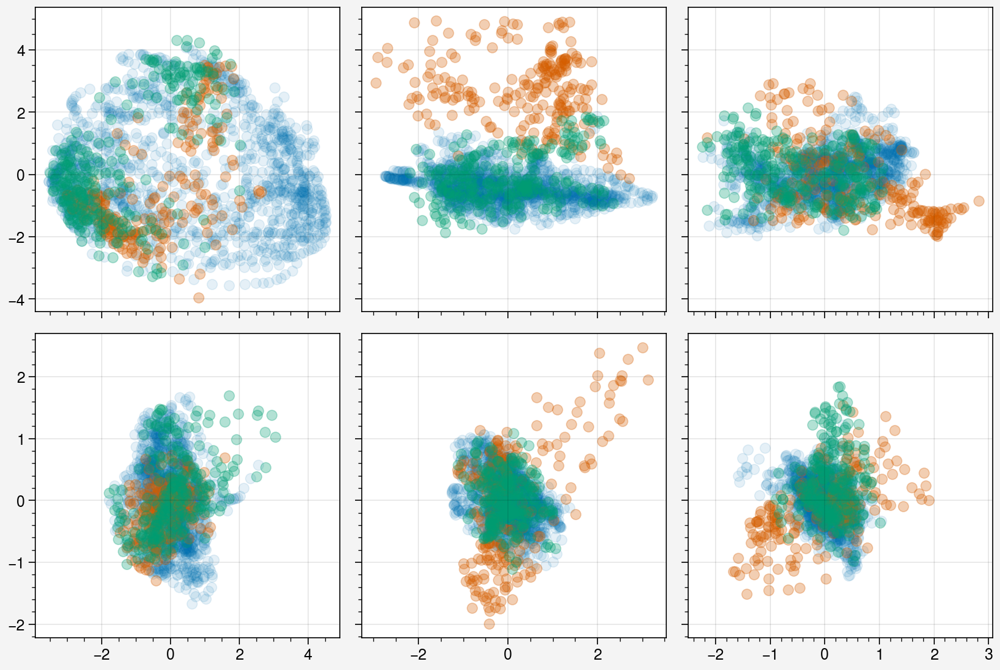

In [98]:
'''Collect up to first+nth step of seeing shortcut
where first is the first step seeing the shortcut'''
n = 5

activs = ep_stack_activations(res)

vis_a = []
a0 = []
a1 = [] #no shortcut avail
a2 = []
for ep in range(100):
    a = activs[ep]['shared_activations'][1]
    vis = res['data']['shortcut_vis'][ep]
    first = np.argmax(vis)
    
    vis_a.append(a[:first+n])
    
    if res['data']['shortcut'][ep][0]:
        a2.append(a[first:first+n])
    else:
        a1.append(a[first:first+n])
    a0.append(a[:first])
vis_a = torch.vstack(vis_a)

pca = PCA()
a_pca = pca.fit_transform(vis_a)
a0 = pca.transform(torch.vstack(a0))
a1 = pca.transform(torch.vstack(a1))
a2 = pca.transform(torch.vstack(a2))

fig, ax = pplt.subplots(nrows=2, ncols=3)
for i in range(6):
    ax[i].scatter(a0[:, i*2], a0[:, i*2+1], alpha=0.1)
    ax[i].scatter(a1[:, i*2], a1[:, i*2+1], alpha=0.3)
    ax[i].scatter(a2[:, i*2], a2[:, i*2+1], alpha=0.3)


<a list of 7 PolyCollection objects>

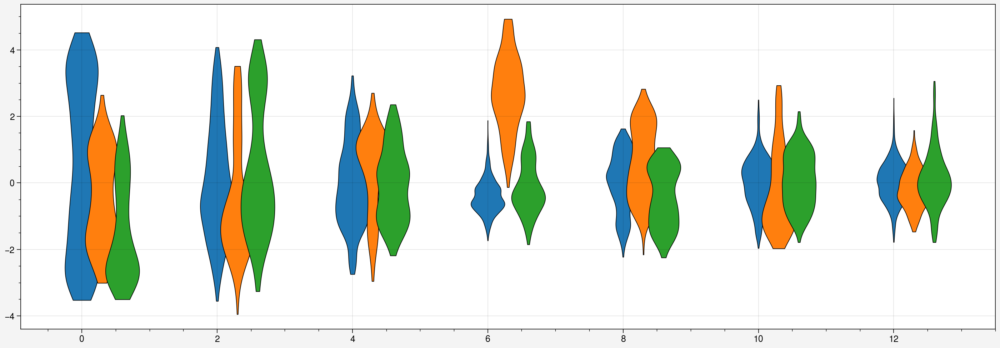

In [99]:
fig, ax = pplt.subplots(refaspect=3, figwidth=14)
m = 7

ax.violin(np.arange(7)*2, a0[:, :7], fc=rgb_colors[0])
ax.violin(np.arange(7)*2+0.3, a1[:, :7], fc=rgb_colors[1])
ax.violin(np.arange(7)*2+0.6, a2[:, :7], fc=rgb_colors[2])

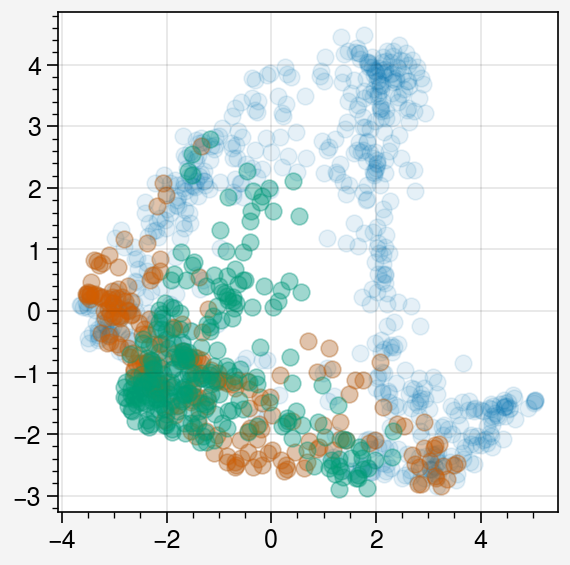

In [43]:
fig, ax = pplt.subplots()
ax.scatter(a_pca[:, 0], a_pca[:, 1], alpha=0.1)
ax.scatter(a1[:, 0], a1[:, 1], alpha=0.3)
ax.scatter(a2[:, 0], a2[:, 1], alpha=0.3)


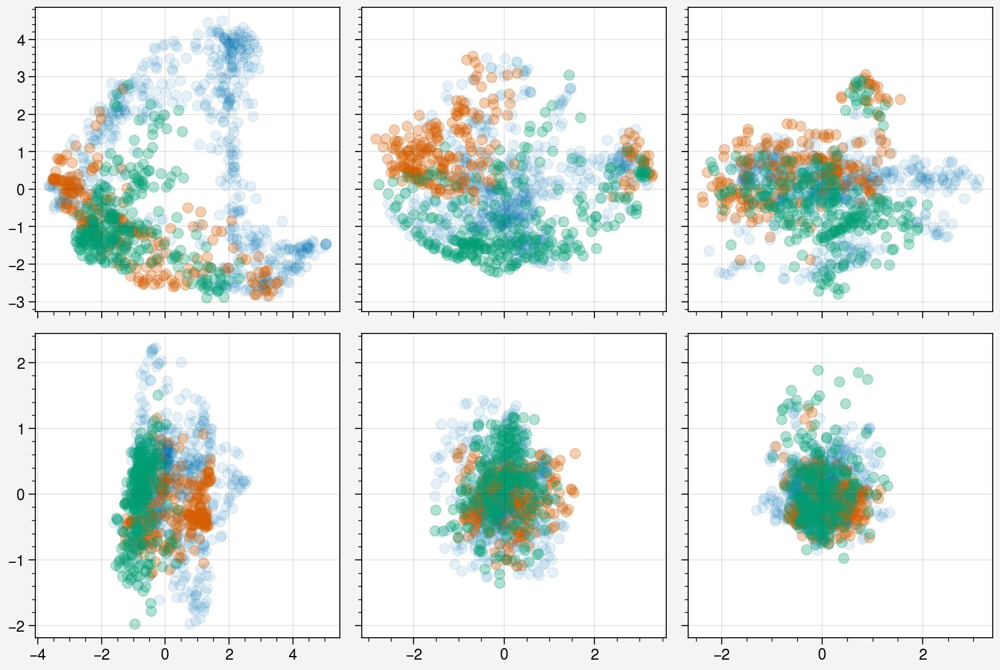

(22,)

In [250]:
np.arange(40, 470, 60).shape

(8,)

## Mean wasserstein distances of activations

In [260]:
chks = np.arange(40, 470, 60)

all_res2 = defaultdict(list)

for x, (p, t) in enumerate(itertools.product([0.1, 0.2, 0.4], range(3))):
    key = f'{p}_{t}'
    for chk in tqdm(chks):
        # model, obs_rms = load_chk(f'shortcutnav_fcp{p}reset3batch64', trial=t, chk=chk)
        model, obs_rms = load_chk(f'shortcut_wc1.5p{p}', subdir='shortcut_wc', trial=t, chk=chk)

        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                               env_kwargs={'character_reset_pos': 3,
                                          'shortcut_probability': 0.5,
                                          'wall_colors': 1.5},
                           seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                               num_episodes=100)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res)

        all_res2[key].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
pickle.dump(all_res2, open('data/shortcut/wc1.5_vis', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████████████| 8/8 [01:44<00:00, 13.12s/it]


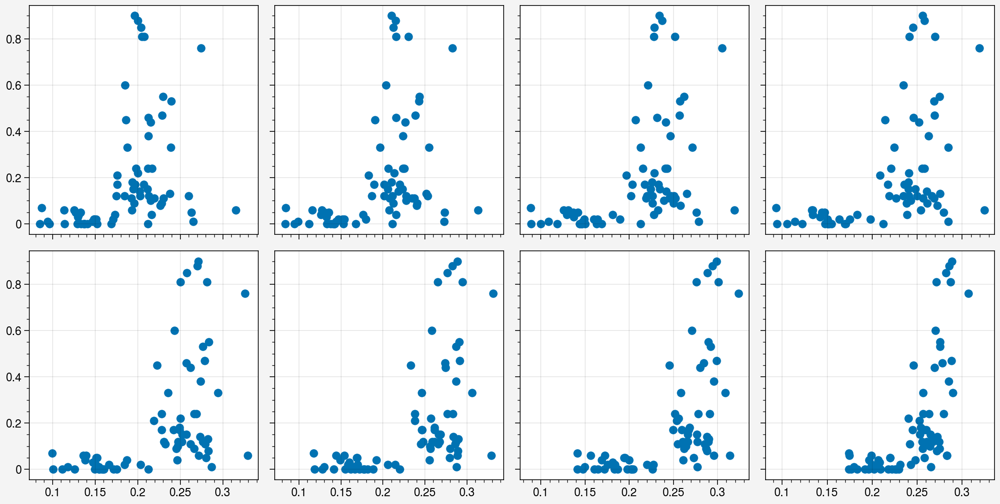

In [272]:
all_shortcut_use_rates = pickle.load(open('data/shortcut/shortcut_wc1.5_userates', 'rb'))

ns = [1, 2, 3, 4, 5, 7, 10, 15]

fig, ax = pplt.subplots(ncols=4, nrows=2)

for j, n in enumerate(ns):
    surs = []
    mean_dists = []
    for key in all_res2:
        for chk in range(8):
            
            res = all_res2[key][chk]

            # activations
            vis_a = []
            a0 = []
            a1 = [] #no shortcut avail
            a2 = [] #shortcut avail

            act0 = []
            act1 = []
            act2 = []
            for ep in range(num_eps):
                a = activs[ep]['shared_activations'][1]
                vis = res['vis'][ep]
                acts = res['actions'][ep]
                first = np.argmax(vis)

                vis_a.append(a[:first+n])

                if res['shortcut'][ep][0]:
                    a2.append(a[first:first+n])
                    act2.append(acts[first:first+n])
                else:
                    a1.append(a[first:first+n])
                    act1.append(acts[first:first+n])
                a0.append(a[:first])
                act0.append(acts[:first])
            vis_a = torch.vstack(vis_a)

            a0 = torch.vstack(a0)
            a1 = torch.vstack(a1)
            a2 = torch.vstack(a2)

            dists = []
            for i in range(64):
                dists.append(wasserstein_distance(a1[:, i], a2[:, i]))

            mean_dists.append(np.mean(dists))
            surs.append(all_shortcut_use_rates[key][chk*3])
        
    ax[j].scatter(mean_dists, surs)

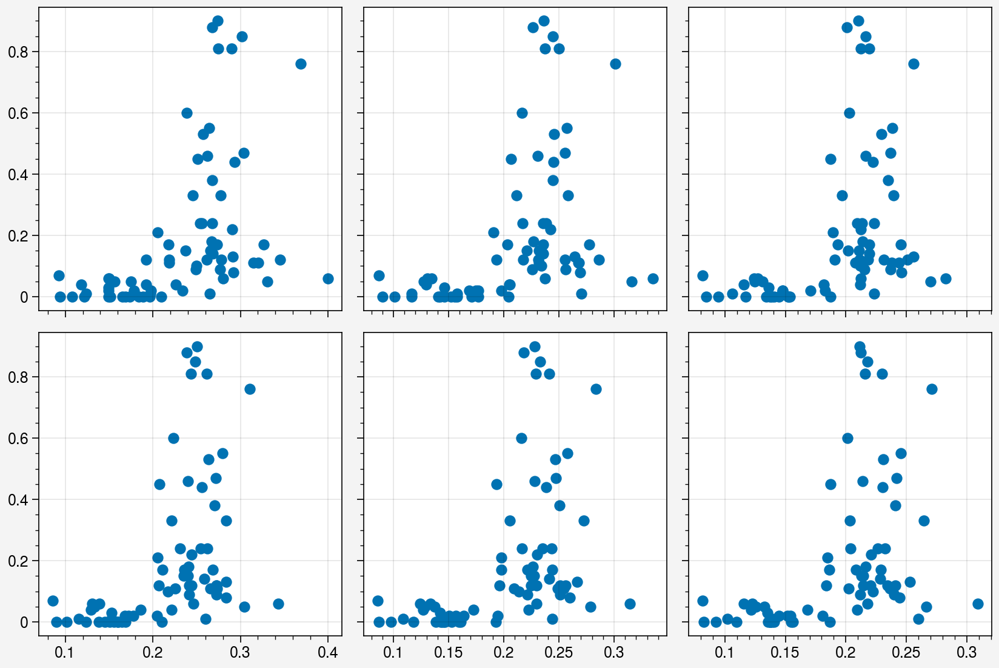

In [273]:
all_shortcut_use_rates = pickle.load(open('data/shortcut/shortcut_wc1.5_userates', 'rb'))

n = 3
tops = [5, 10, 15, 20, 25, 30]

fig, ax = pplt.subplots(ncols=3, nrows=2)

for j, top in enumerate(tops):
    surs = []
    mean_dists = []
    for key in all_res2:
        for chk in range(8):
            
            res = all_res2[key][chk]

            # activations
            vis_a = []
            a0 = []
            a1 = [] #no shortcut avail
            a2 = [] #shortcut avail

            act0 = []
            act1 = []
            act2 = []
            for ep in range(num_eps):
                a = activs[ep]['shared_activations'][1]
                vis = res['vis'][ep]
                acts = res['actions'][ep]
                first = np.argmax(vis)

                vis_a.append(a[:first+n])

                if res['shortcut'][ep][0]:
                    a2.append(a[first:first+n])
                    act2.append(acts[first:first+n])
                else:
                    a1.append(a[first:first+n])
                    act1.append(acts[first:first+n])
                a0.append(a[:first])
                act0.append(acts[:first])
            vis_a = torch.vstack(vis_a)

            a0 = torch.vstack(a0)
            a1 = torch.vstack(a1)
            a2 = torch.vstack(a2)

            dists = []
            for i in range(64):
                dists.append(wasserstein_distance(a1[:, i], a2[:, i]))

            mean_dists.append(np.mean(dists[-top:]))
            surs.append(all_shortcut_use_rates[key][chk*3])
        
    ax[j].scatter(mean_dists, surs)

(array([ 1.,  1.,  0.,  0.,  1.,  1.,  3.,  2.,  6., 57.]),
 array([245., 248., 251., 254., 257., 260., 263., 266., 269., 272., 275.]),
 <BarContainer object of 10 artists>)

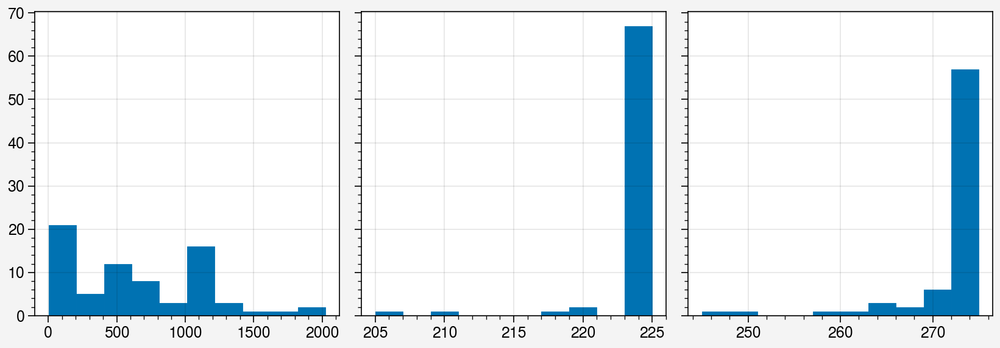

In [266]:
all_shortcut_use_rates = pickle.load(open('data/shortcut/shortcut_wc1.5_userates', 'rb'))

n = 5
fig, ax = pplt.subplots(ncols=3)
step0 = []
step1 = []
step2 = []
for key in all_res:
    for chk in range(8):

        res = all_res[key][chk]

        # activations
        vis_a = []
        a0 = []
        a1 = [] #no shortcut avail
        a2 = [] #shortcut avail

        act0 = []
        act1 = []
        act2 = []
        for ep in range(num_eps):
            a = activs[ep]['shared_activations'][1]
            vis = res['vis'][ep]
            acts = res['actions'][ep]
            first = np.argmax(vis)

            vis_a.append(a[:first+n])

            if res['shortcut'][ep][0]:
                a2.append(a[first:first+n])
                act2.append(acts[first:first+n])
            else:
                a1.append(a[first:first+n])
                act1.append(acts[first:first+n])
            a0.append(a[:first])
            act0.append(acts[:first])
        vis_a = torch.vstack(vis_a)

        a0 = torch.vstack(a0)
        a1 = torch.vstack(a1)
        a2 = torch.vstack(a2)
        step0.append(len(a0))
        step1.append(len(a1))
        step2.append(len(a2))

ax[0].hist(step0)
ax[1].hist(step1)
ax[2].hist(step2)


In [251]:
chks = np.arange(40, 470, 60)

all_res = defaultdict(list)

for x, (p, t) in enumerate(itertools.product([0.1, 0.2, 0.4], range(3))):
    key = f'{p}_{t}'
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcutnav_fcp{p}reset3batch64', trial=t, chk=chk)
        # model, obs_rms = load_chk(f'shortcut_wc1.5p{p}', subdir='shortcut_wc', trial=t, chk=460)

        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                               env_kwargs={'character_reset_pos': 3,
                                          'shortcut_probability': 0.5},
                           seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                               num_episodes=100)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res)

        all_res[key].append( {
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        } )
        
pickle.dump(all_res, open('data/shortcut/wc4_vis', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████████████| 8/8 [01:00<00:00,  7.58s/it]


In [252]:
len([40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240, 260, 280, 300, 320, 340, 360, 380, 400, 420, 440, 460])

22

In [258]:
chks

array([ 40, 100, 160, 220, 280, 340, 400, 460])

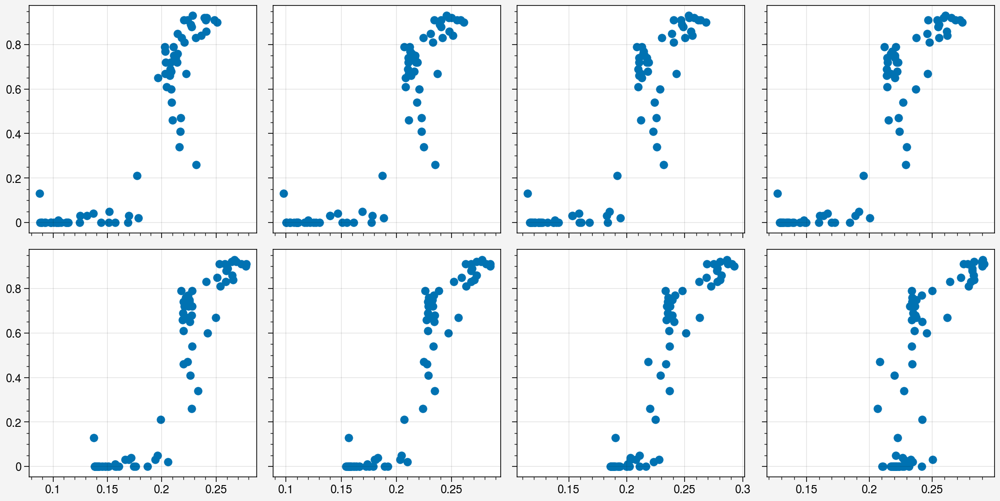

In [259]:
all_shortcut_use_rates = pickle.load(open('data/shortcut/shortcut_wc4_userates', 'rb'))

ns = [1, 2, 3, 4, 5, 7, 10, 15]

fig, ax = pplt.subplots(ncols=4, nrows=2)

for j, n in enumerate(ns):
    surs = []
    mean_dists = []
    for key in all_res:
        for chk in range(8):
            
            res = all_res[key][chk]

            # activations
            vis_a = []
            a0 = []
            a1 = [] #no shortcut avail
            a2 = [] #shortcut avail

            act0 = []
            act1 = []
            act2 = []
            for ep in range(num_eps):
                a = activs[ep]['shared_activations'][1]
                vis = res['vis'][ep]
                acts = res['actions'][ep]
                first = np.argmax(vis)

                vis_a.append(a[:first+n])

                if res['shortcut'][ep][0]:
                    a2.append(a[first:first+n])
                    act2.append(acts[first:first+n])
                else:
                    a1.append(a[first:first+n])
                    act1.append(acts[first:first+n])
                a0.append(a[:first])
                act0.append(acts[:first])
            vis_a = torch.vstack(vis_a)

            a0 = torch.vstack(a0)
            a1 = torch.vstack(a1)
            a2 = torch.vstack(a2)

            dists = []
            for i in range(64):
                dists.append(wasserstein_distance(a1[:, i], a2[:, i]))

            mean_dists.append(np.mean(dists))
            surs.append(all_shortcut_use_rates['64_'+key][chk*3])
        
    ax[j].scatter(mean_dists, surs)

0.2682275344871662


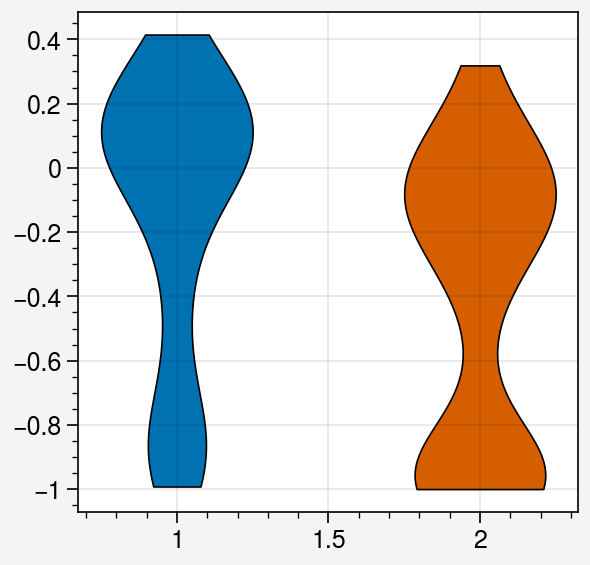

In [225]:
i = 13
fig, ax = pplt.subplots()
ax.violin(1, a1[:, i])
ax.violin(2, a2[:, i])
print(wasserstein_distance(a1[:, i], a2[:, i]))

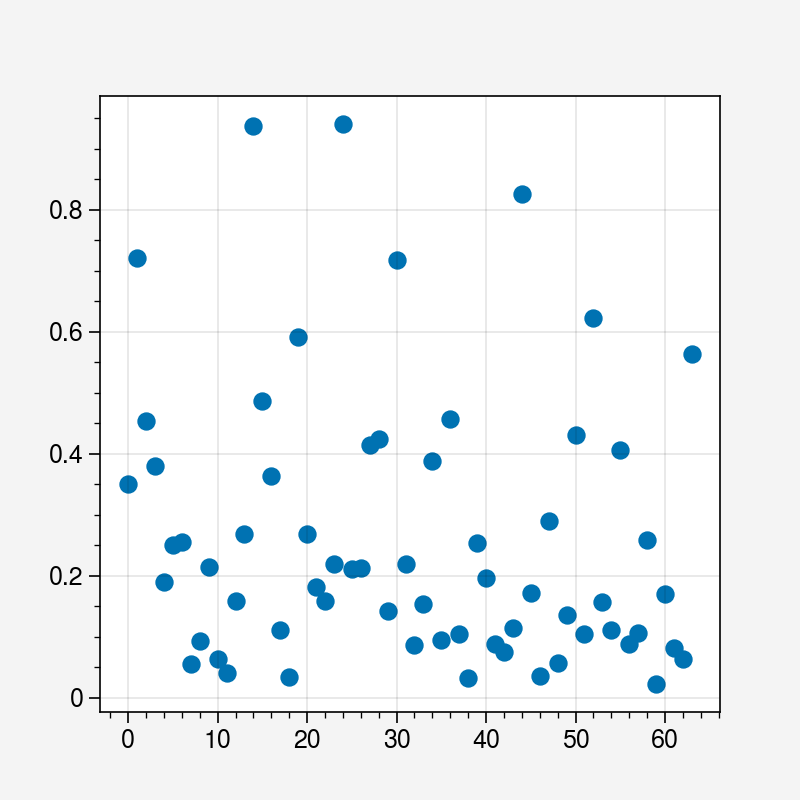

In [227]:
plt.scatter(np.arange(64), dists)

In [ ]:
all_shortcut_use_rates = pickle.load(open('data/shortcut/shortcut_wc4_userates', 'rb'))

ns = [1, 2, 3, 4, 5, 7, 10, 15]

fig, ax = pplt.subplots(ncols=4, nrows=2)

for j, n in enumerate(ns):
    surs = []
    mean_dists = []
    for key in all_res:
        res = all_res[key]

        # activations
        vis_a = []
        a0 = []
        a1 = [] #no shortcut avail
        a2 = [] #shortcut avail

        act0 = []
        act1 = []
        act2 = []
        for ep in range(num_eps):
            a = activs[ep]['shared_activations'][1]
            vis = res['vis'][ep]
            acts = res['actions'][ep]
            first = np.argmax(vis)

            vis_a.append(a[:first+n])

            if res['shortcut'][ep][0]:
                a2.append(a[first:first+n])
                act2.append(acts[first:first+n])
            else:
                a1.append(a[first:first+n])
                act1.append(acts[first:first+n])
            a0.append(a[:first])
            act0.append(acts[:first])
        vis_a = torch.vstack(vis_a)

        a0 = torch.vstack(a0)
        a1 = torch.vstack(a1)
        a2 = torch.vstack(a2)

        dists = []
        for i in range(64):
            dists.append(wasserstein_distance(a1[:, i], a2[:, i]))

        mean_dists.append(np.mean(dists))
        surs.append(all_shortcut_use_rates['64_'+key][-1])
        
    ax[j].scatter(mean_dists, surs)

## Highest wasserstein nodes and example activation trajectories

In [274]:
all_res2 = pickle.load(open('data/shortcut/wc1.5_vis', 'rb'))

In [329]:
key = '0.4_2'
chk = 7
res = all_res2[key][chk]

top_idxs = []
ns = [10, 20]

for n in ns:
    # activations
    vis_a = []
    a0 = []
    a1 = [] #no shortcut avail
    a2 = [] #shortcut avail
    
    for ep in range(num_eps):
        a = activs[ep]['shared_activations'][1]
        # a = activs[ep]['critic_activations'][0]
        vis = res['vis'][ep]
        first = np.argmax(vis)
        vis_a.append(a[:first+n])

        if res['shortcut'][ep][0]:
            a2.append(a[first:first+n] - a[first])
        else:
            a1.append(a[first:first+n] - a[first])
        a0.append(a[:first])
    vis_a = torch.vstack(vis_a)

    a0 = torch.vstack(a0)
    a1 = torch.vstack(a1)
    a2 = torch.vstack(a2)

    dists = []
    for i in range(64):
        dists.append(wasserstein_distance(a1[:, i], a2[:, i]))
        
    # top_idxs.append(np.argsort(dists)[-10:])
    top_idxs.append(np.argsort(dists)[:10])    

In [320]:
np.unique(top_idxs, return_counts=True)

(array([ 0,  2,  4, 16, 18, 28, 30, 38, 43, 46, 50, 56, 61], dtype=int64),
 array([1, 2, 1, 1, 2, 1, 2, 1, 2, 2, 1, 2, 2], dtype=int64))

In [330]:
np.unique(top_idxs, return_counts=True)

(array([ 0,  4, 12, 15, 22, 27, 29, 31, 32, 36, 39, 41, 42, 45, 52, 57],
       dtype=int64),
 array([1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 1, 1, 1, 1, 2], dtype=int64))

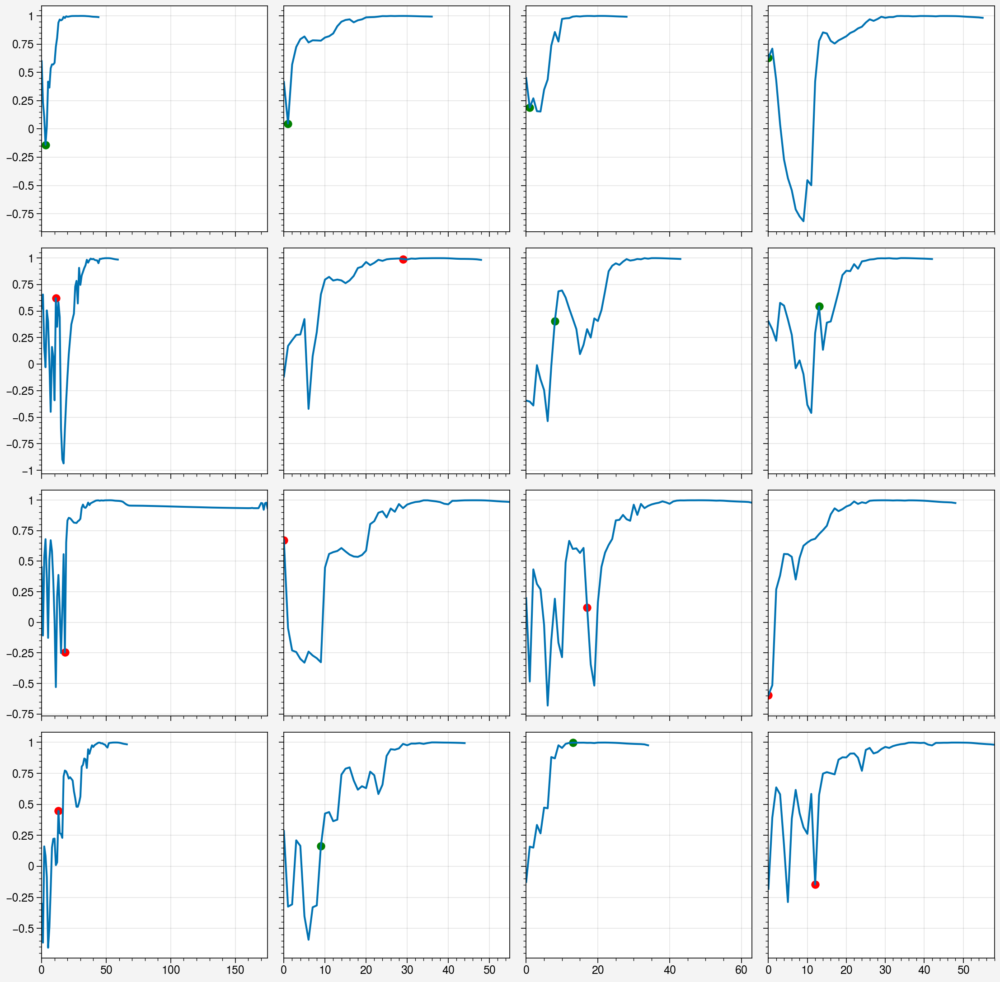

In [ ]:
idx = 58
activs = res['activs']
fig, ax = pplt.subplots(nrows=4, ncols=4)
for ep in range(16):
    # a = activs[ep]['shared_activations'][1][:, idx]
    a = activs[ep]['critic_activations'][0][:, idx]
    vis = res['vis'][ep]
    first = np.argmax(vis)
    ax[ep].plot(np.arange(len(a)), a)

    if res['shortcut'][ep][0]:
        ax[ep].scatter([first], [a[first]], color='green')
    else:
        ax[ep].scatter([first], [a[first]], color='red')
        


In [332]:
pplt.rc.reset()

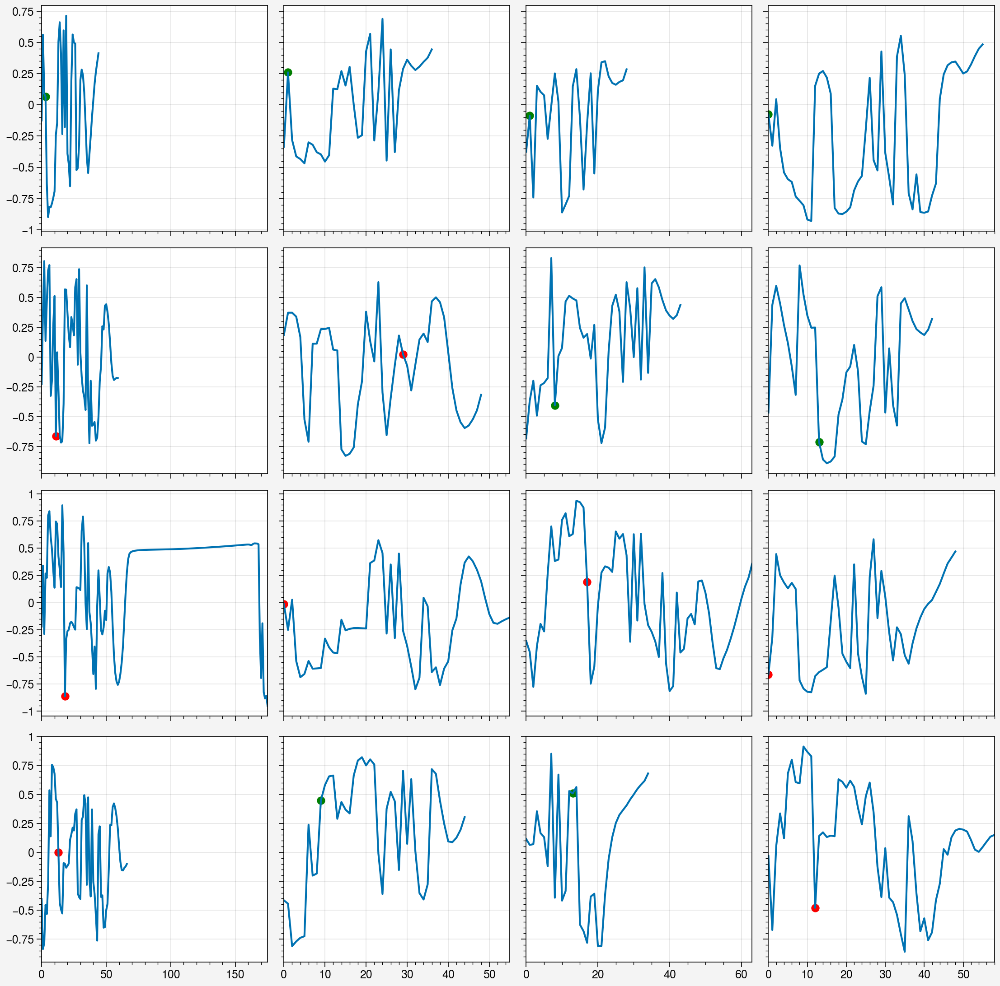

In [333]:
idx = 29
activs = res['activs']
fig, ax = pplt.subplots(nrows=4, ncols=4)
for ep in range(16):
    # a = activs[ep]['shared_activations'][1][:, idx]
    a = activs[ep]['critic_activations'][0][:, idx]
    vis = res['vis'][ep]
    first = np.argmax(vis)
    ax[ep].plot(np.arange(len(a)), a)

    if res['shortcut'][ep][0]:
        ax[ep].scatter([first], [a[first]], color='green')
    else:
        ax[ep].scatter([first], [a[first]], color='red')
        


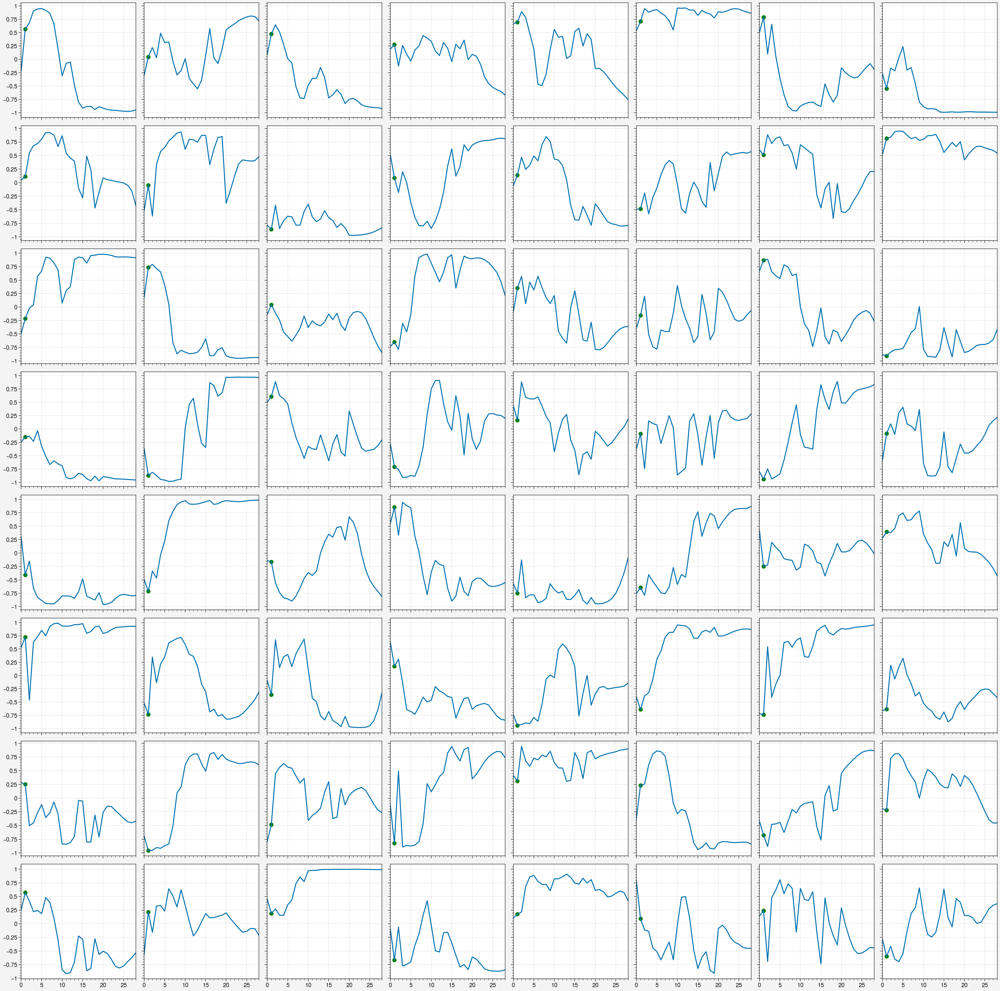

In [334]:
activs = res['activs']
fig, ax = pplt.subplots(nrows=8, ncols=8)
for ep in range(64):
    # a = activs[ep]['shared_activations'][1][:, idx]
    a = activs[2]['critic_activations'][0][:, ep]
    vis = res['vis'][2]
    first = np.argmax(vis)
    ax[ep].plot(np.arange(len(a)), a)

    if res['shortcut'][2][0]:
        ax[ep].scatter([first], [a[first]], color='green')
    else:
        ax[ep].scatter([first], [a[first]], color='red')
        


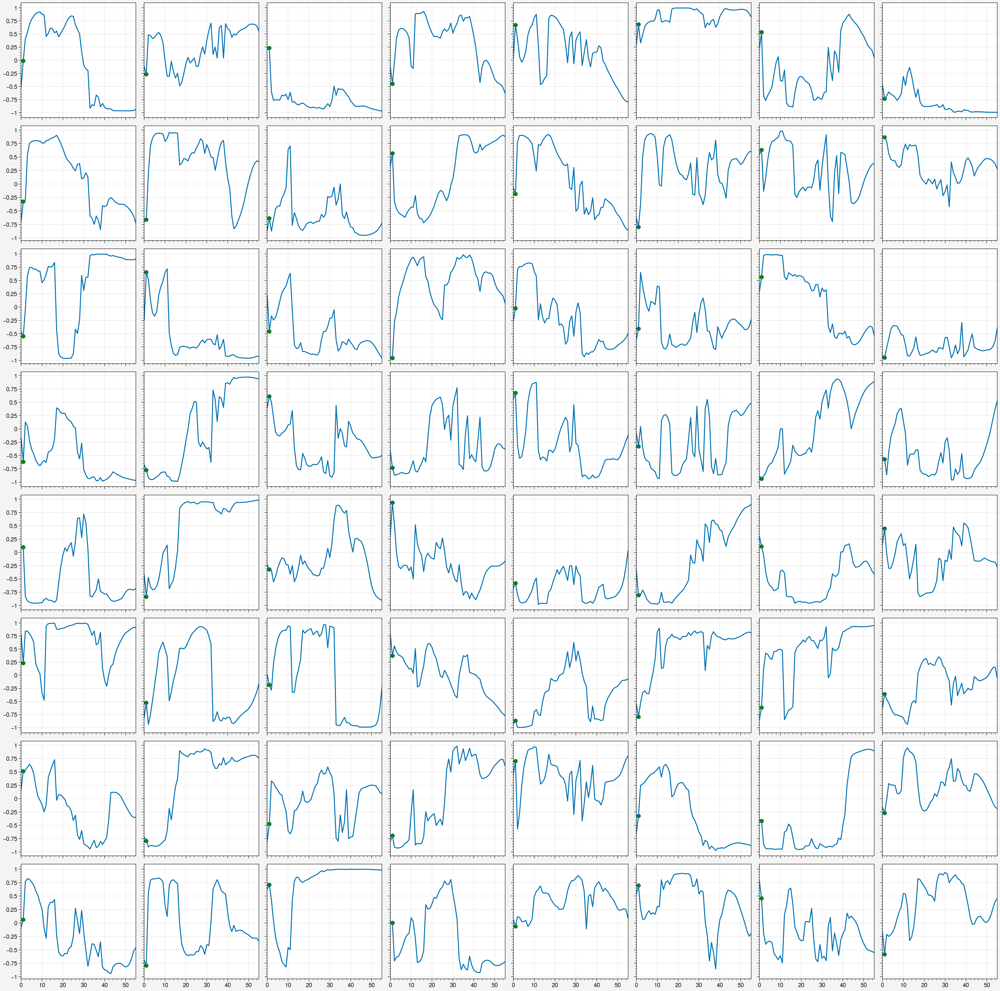

In [335]:
activs = res['activs']
fig, ax = pplt.subplots(nrows=8, ncols=8)
for ep in range(64):
    # a = activs[ep]['shared_activations'][1][:, idx]
    a = activs[3]['critic_activations'][0][:, ep]
    vis = res['vis'][2]
    first = np.argmax(vis)
    ax[ep].plot(np.arange(len(a)), a)

    if res['shortcut'][2][0]:
        ax[ep].scatter([first], [a[first]], color='green')
    else:
        ax[ep].scatter([first], [a[first]], color='red')
        


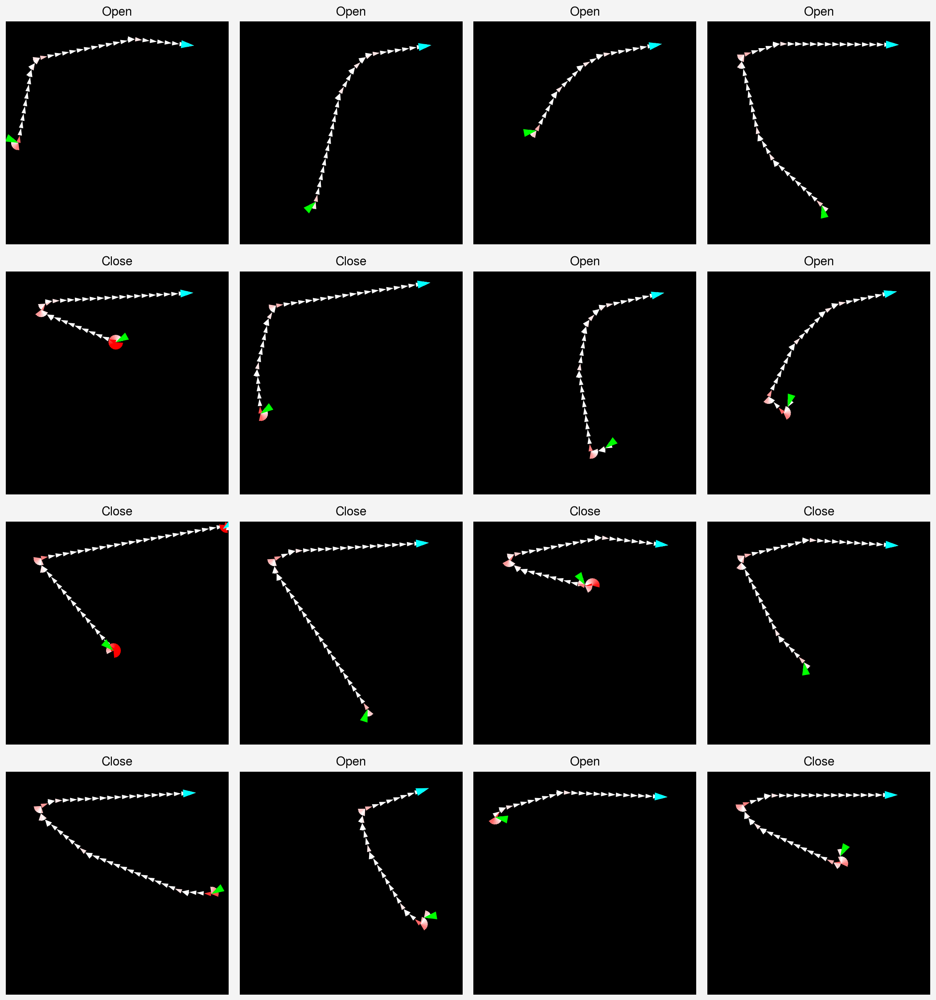

In [310]:
set_trajectory_plot_style()
fig, ax = pplt.subplots(nrows=4, ncols=4)
title = []
for ep in range(16):
    pos = res['ep_pos'][ep]
    angle = res['ep_angle'][ep]

    vis = res['vis'][ep]
    first = np.argmax(vis)

    if res['shortcut'][ep][0]:
        title.append('Open')
    else:
        title.append('Close')
        
    draw_trajectory(pos, angle, ax=ax[ep])
ax.format(xlim=[0, 300], ylim=[0, 300], title=title)
pplt.rc.reset()


IndexError: list index out of range

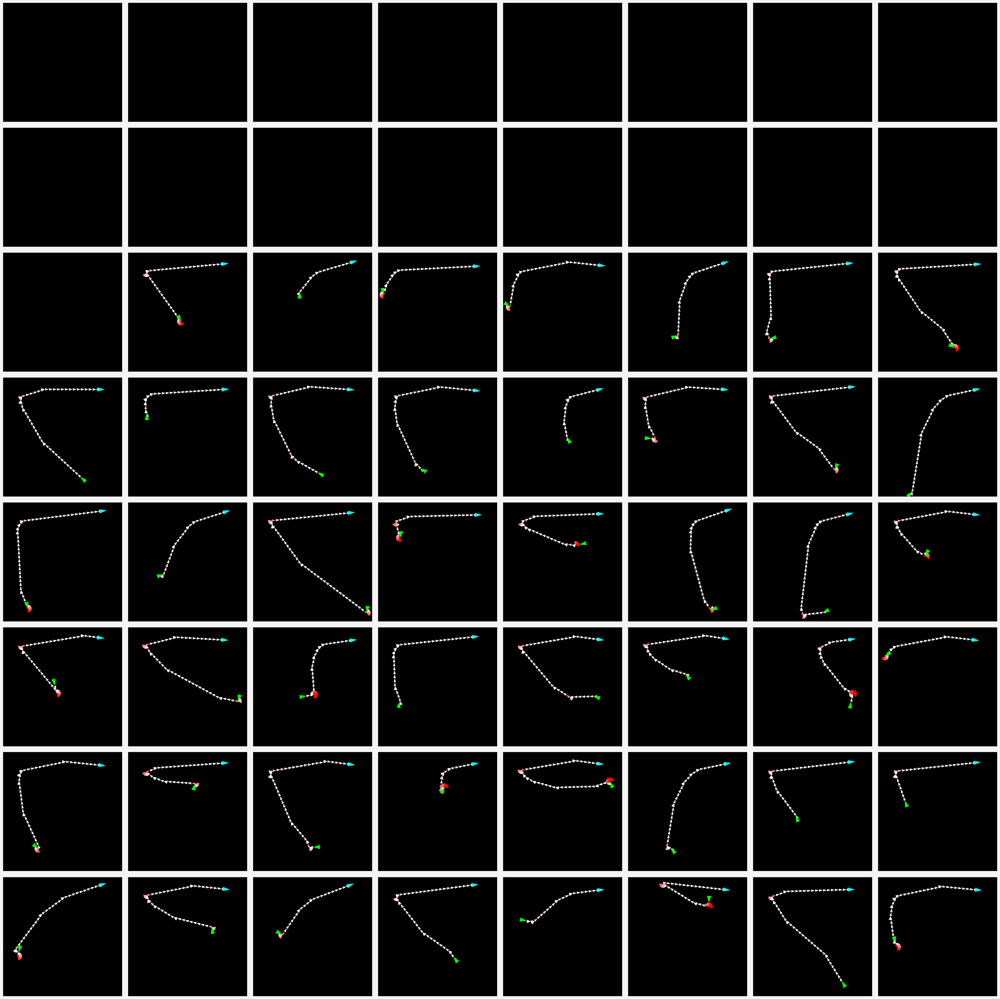

In [327]:
set_trajectory_plot_style()
fig, ax = pplt.subplots(nrows=8, ncols=8)
title = []
for ep in range(17, 17+64):
    pos = res['ep_pos'][ep]
    angle = res['ep_angle'][ep]

    vis = res['vis'][ep]
    first = np.argmax(vis)

    if res['shortcut'][ep][0]:
        title.append('Open')
    else:
        title.append('Close')
        
    draw_trajectory(pos, angle, ax=ax[ep-17])
ax.format(xlim=[0, 300], ylim=[0, 300], title=title)
pplt.rc.reset()


In [303]:
eps = [3, ]

In [290]:
np.unique(top_idxs, return_counts=True)

(array([ 1, 11, 17, 19, 21, 22, 25, 26, 43, 44, 46, 48, 56, 63],
       dtype=int64),
 array([5, 3, 5, 5, 4, 5, 4, 5, 2, 4, 2, 1, 2, 3], dtype=int64))

In [291]:
key = '0.2_2'
chk = 7
res = all_res[key][chk]

top_idxs = []
ns = [3, 5, 10, 15, 20]

for n in ns:
    # activations
    vis_a = []
    a0 = []
    a1 = [] #no shortcut avail
    a2 = [] #shortcut avail
    
    for ep in range(num_eps):
        a = activs[ep]['shared_activations'][1]
        vis = res['vis'][ep]
        first = np.argmax(vis)
        vis_a.append(a[:first+n])

        if res['shortcut'][ep][0]:
            a2.append(a[first:first+n])
        else:
            a1.append(a[first:first+n])
        a0.append(a[:first])
    vis_a = torch.vstack(vis_a)

    a0 = torch.vstack(a0)
    a1 = torch.vstack(a1)
    a2 = torch.vstack(a2)

    dists = []
    for i in range(64):
        dists.append(wasserstein_distance(a1[:, i], a2[:, i]))
        
    top_idxs.append(np.argsort(dists)[-10:])

In [292]:
np.unique(top_idxs, return_counts=True)

(array([ 1,  7, 11, 17, 19, 21, 22, 23, 25, 26, 44, 56, 59, 60, 63],
       dtype=int64),
 array([5, 1, 2, 2, 5, 5, 5, 1, 4, 5, 5, 3, 1, 2, 4], dtype=int64))

# Differences in open vs closed on same starts

Idea: use the same n starting points on a p=0.1 4 wall color agent that uses shortcut effectively, once with shortcut open and once with shortcut closed, see differences in activations

In [2]:
model, obs_rms = load_chk(f'shortcutnav_fcp0.1reset3batch64', trial=0, chk=400)

seed = 1

res1 = test_shortcut_activations(model, obs_rms, seed=1, shortcut_probability=0,
                         test_only=True, skip_activs=False)
res2 = test_shortcut_activations(model, obs_rms, seed=1, shortcut_probability=1,
                         test_only=True, skip_activs=False)

In [ ]:
'''Only keep activations where a shortcut was used on res2'''

ep_su = res2['ep_shortcut_used']

ep_lens1 = get_ep_lens(res1['ep_pos'])
ep_lens2 = get_ep_lens(res2['ep_pos'])

activ1 = res1['activs']['shared_activations'][1]
activ2 = res2['activs']['shared_activations'][1]

ep_activ1 = ep_split_res(activ1, ep_lens1)
ep_activ2 = ep_split_res(activ2, ep_lens2)

activ1 = []
activ2 = []

ep_pos1 = res1['ep_pos']
ep_pos2 = res2['ep_pos']
pos1 = []
pos2 = []
for i in range(100):
    if ep_su[i]:
        activ1.append(ep_activ1[i])
        activ2.append(ep_activ2[i])
        
        pos1.append(ep_pos1[i])
        pos2.append(ep_pos2[i])
        
activ1 = np.vstack(activ1)
activ2 = np.vstack(activ2)

pos1 = np.vstack(pos1)
pos2 = np.vstack(pos2)

# activ1 = res1['activs']['shared_activations'][1]
# activ2 = res2['activs']['shared_activations'][1]

activ = np.vstack([activ1, activ2])
umap = UMAP(min_dist=0.75)
activ2d = umap.fit_transform(activ)

activ2d1 = activ2d[:len(activ1)]
activ2d2 = activ2d[len(activ1):]


'''Find unique points in umap space'''
xmin, ymin = np.min(activ2d, axis=0)
xmax, ymax = np.max(activ2d, axis=0)
xgrid = np.linspace(xmin, xmax)
ygrid = np.linspace(ymin, ymax)

a2unique = []
a1unique = []
a1shared = []
a2shared = []

a1idxs = []
a2idxs = []
for i, j in itertools.product(range(len(xgrid)-1), range(len(ygrid)-1)):
    x1, x2 = xgrid[i], xgrid[i+1]
    y1, y2 = ygrid[j], ygrid[j+1]
    a1idx = (activ2d1[:, 0] < x2) & (activ2d1[:, 0] > x1) & \
                    (activ2d1[:, 1] < y2) & (activ2d1[:, 1] > y1)
    a2idx = (activ2d2[:, 0] < x2) & (activ2d2[:, 0] > x1) & \
                    (activ2d2[:, 1] < y2) & (activ2d2[:, 1] > y1)
    a1in = activ2d1[a1idx]
    a2in = activ2d2[a2idx]
    # if a1in.sum()
    if len(a1in)>0 and len(a2in)>0:
        a1shared.append(a1in)
        a2shared.append(a2in)
    elif len(a1in)>0:
        a1unique.append(a1in)
        a1idxs.append(a1idx)
    elif len(a2in)>0:
        a2unique.append(a2in)
        a2idxs.append(a2idx)
        
a2unique = np.vstack(a2unique)
a1unique = np.vstack(a1unique)
a1shared = np.vstack(a1shared)
a2shared = np.vstack(a2shared)

a1idxs = np.vstack(a1idxs).any(axis=0)
a2idxs = np.vstack(a2idxs).any(axis=0)

'''plot umap activations and positions'''
fig, ax = pplt.subplots(nrows=2, ncols=2, sharex=False)

ax[0,0].scatter(a1shared.T[0], a1shared.T[1], alpha=0.1)
ax[0,0].scatter(a2shared.T[0], a2shared.T[1], alpha=0.1)
ax[0,1].scatter(a1unique.T[0], a1unique.T[1], alpha=0.1)
ax[0,1].scatter(a2unique.T[0], a2unique.T[1], alpha=0.1)

ax[1,0].scatter(pos1[a1idxs, 0], pos1[a1idxs, 1], alpha=0.1)
ax[1,1].scatter(pos2[a2idxs, 0], pos2[a2idxs, 1], alpha=0.1)

ax[1,:].format(xlim=[0, 300], ylim=[0, 300],
          title=['Common activations', 'Unique activations', 'No shortcuts', 'Shortcuts'])

In [ ]:
ep = 9
a1, a2 = ep_activ1[ep], ep_activ2[ep]

a = torch.vstack([a1, a2])
umap = UMAP(min_dist=0.75)
a2d = umap.fit_transform(a)

In [ ]:
fig, ax = pplt.subplots()
a2d1 = a2d[:len(a1)]
a2d2 = a2d[len(a1):]
ax.scatter(a2d1.T[0], a2d1.T[1], alpha=0.3)
ax.scatter(a2d2.T[0], a2d2.T[1], alpha=0.3)

ax.scatter([a2d1[0, 0]], [a2d1[0, 1]])
ax.scatter([a2d2[0, 0]], [a2d2[0, 1]])

In [ ]:
activ = torch.vstack([activ1, activ2])
umap = UMAP(min_dist=0.75)
activ2d = umap.fit_transform(activ)

In [ ]:
fig, ax = pplt.subplots()
activ2d1 = activ2d[:len(activ1)]
activ2d2 = activ2d[len(activ1):]
ax.scatter(activ2d1.T[0], activ2d1.T[1], alpha=0.1)
ax.scatter(activ2d2.T[0], activ2d2.T[1], alpha=0.1)

In [ ]:
fig, ax = pplt.subplots(ncols=2)
ax[0].scatter(a1shared.T[0], a1shared.T[1], alpha=0.1)
ax[0].scatter(a2shared.T[0], a2shared.T[1], alpha=0.1)
ax[1].scatter(a1unique.T[0], a1unique.T[1], alpha=0.1)
ax[1].scatter(a2unique.T[0], a2unique.T[1], alpha=0.1)

**Only eps where shortcut used in res2**

In [ ]:
pplt.rc.reset()

In [ ]:
activ = np.vstack([activ1, activ2])
umap = UMAP(min_dist=0.75)
activ2d = umap.fit_transform(activ)

activ2d1 = activ2d[:len(activ1)]
activ2d2 = activ2d[len(activ1):]


In [ ]:
'''Find unique points in umap space'''

xmin, ymin = np.min(activ2d, axis=0)
xmax, ymax = np.max(activ2d, axis=0)
xgrid = np.linspace(xmin, xmax)
ygrid = np.linspace(ymin, ymax)

a2unique = []
a1unique = []
a1shared = []
a2shared = []

a1idxs = []
a2idxs = []
for i, j in itertools.product(range(len(xgrid)-1), range(len(ygrid)-1)):
    x1, x2 = xgrid[i], xgrid[i+1]
    y1, y2 = ygrid[j], ygrid[j+1]
    a1idx = (activ2d1[:, 0] < x2) & (activ2d1[:, 0] > x1) & \
                    (activ2d1[:, 1] < y2) & (activ2d1[:, 1] > y1)
    a2idx = (activ2d2[:, 0] < x2) & (activ2d2[:, 0] > x1) & \
                    (activ2d2[:, 1] < y2) & (activ2d2[:, 1] > y1)
    a1in = activ2d1[a1idx]
    a2in = activ2d2[a2idx]
    # if a1in.sum()
    if len(a1in)>0 and len(a2in)>0:
        a1shared.append(a1in)
        a2shared.append(a2in)
    elif len(a1in)>0:
        a1unique.append(a1in)
        a1idxs.append(a1idx)
    elif len(a2in)>0:
        a2unique.append(a2in)
        a2idxs.append(a2idx)
        
a2unique = np.vstack(a2unique)
a1unique = np.vstack(a1unique)
a1shared = np.vstack(a1shared)
a2shared = np.vstack(a2shared)

a1idxs = np.vstack(a1idxs).any(axis=0)
a2idxs = np.vstack(a2idxs).any(axis=0)

In [ ]:
fig, ax = pplt.subplots(ncols=2)
ax[0].scatter(a1shared.T[0], a1shared.T[1], alpha=0.1)
ax[0].scatter(a2shared.T[0], a2shared.T[1], alpha=0.1)
ax[1].scatter(a1unique.T[0], a1unique.T[1], alpha=0.1)
ax[1].scatter(a2unique.T[0], a2unique.T[1], alpha=0.1)

In [ ]:
fig, ax = pplt.subplots(ncols=2)

pos1 = res1['pos']
pos2 = res2['pos']

ax[0].scatter(pos1[a1idxs, 0], pos1[a1idxs, 1], alpha=0.1)
ax[1].scatter(pos2[a2idxs, 0], pos2[a2idxs, 1], alpha=0.1)


ax.format(xlim=[0, 300], ylim=[0, 300],
          title=['No shortcuts', 'Shortcuts'])

In [ ]:
fig, ax = pplt.subplots(ncols=2)

ax[0].scatter(pos1[a1idxs, 0], pos1[a1idxs, 1], alpha=0.1)
ax[1].scatter(pos2[a2idxs, 0], pos2[a2idxs, 1], alpha=0.1)


ax.format(xlim=[0, 300], ylim=[0, 300],
          title=['No shortcuts', 'Shortcuts'])

In [ ]:
'''Find first 5 points'''

In [ ]:
set_trajectory_plot_style()

In [ ]:
fig, ax = pplt.subplots(ncols=2)
ep = 6


res = res1
ep_pos = res['ep_pos']
ep_lens = get_ep_lens(ep_pos)
ep_angles = ep_split_res(res['angle'], ep_lens)

p = ep_pos[ep]
a = ep_angles[ep].reshape(-1, 1)
draw_trajectory(p, a, ax=ax[0])

res = res2
ep_pos = res['ep_pos']
ep_lens = get_ep_lens(ep_pos)
ep_angles = ep_split_res(res['angle'], ep_lens)

p = ep_pos[ep]
a = ep_angles[ep].reshape(-1, 1)
draw_trajectory(p, a, ax=ax[1])


ax.format(xlim=[0, 300], ylim=[0, 300],
          title=['No shortcuts', 'Shortcuts'])

In [ ]:
a1 = ep_activ1[ep]
a2 = ep_activ2[ep]


In [ ]:
a = a1[:40] - a2[:40]

In [ ]:
a.shape

In [ ]:
fig, ax = pplt.subplots(nrows=8, ncols=8)
for i in range(64):
    ax[i].plot(a.T[i])

In [ ]:
model, obs_rms = load_chk(f'shortcutnav_fcp0.4reset3batch64', trial=1, chk=400)

seed = 1

res1 = test_shortcut_activations(model, obs_rms, seed=1, shortcut_probability=0,
                         test_only=True, skip_activs=False)
res2 = test_shortcut_activations(model, obs_rms, seed=1, shortcut_probability=1,
                         test_only=True, skip_activs=False)

'''Only keep activations where a shortcut was used on res2'''

ep_su = res2['ep_shortcut_used']

ep_lens1 = get_ep_lens(res1['ep_pos'])
ep_lens2 = get_ep_lens(res2['ep_pos'])

activ1 = res1['activs']['shared_activations'][1]
activ2 = res2['activs']['shared_activations'][1]

ep_activ1 = ep_split_res(activ1, ep_lens1)
ep_activ2 = ep_split_res(activ2, ep_lens2)

activ1 = []
activ2 = []

ep_pos1 = res1['ep_pos']
ep_pos2 = res2['ep_pos']
pos1 = []
pos2 = []
for i in range(100):
    if ep_su[i]:
        activ1.append(ep_activ1[i])
        activ2.append(ep_activ2[i])
        
        pos1.append(ep_pos1[i])
        pos2.append(ep_pos2[i])
        
activ1 = np.vstack(activ1)
activ2 = np.vstack(activ2)

pos1 = np.vstack(pos1)
pos2 = np.vstack(pos2)

# activ1 = res1['activs']['shared_activations'][1]
# activ2 = res2['activs']['shared_activations'][1]

activ = np.vstack([activ1, activ2])
umap = UMAP(min_dist=0.75)
activ2d = umap.fit_transform(activ)

activ2d1 = activ2d[:len(activ1)]
activ2d2 = activ2d[len(activ1):]

'''Find unique points in umap space'''
xmin, ymin = np.min(activ2d, axis=0)
xmax, ymax = np.max(activ2d, axis=0)
xgrid = np.linspace(xmin, xmax)
ygrid = np.linspace(ymin, ymax)

a2unique = []
a1unique = []
a1shared = []
a2shared = []

a1idxs = []
a2idxs = []
for i, j in itertools.product(range(len(xgrid)-1), range(len(ygrid)-1)):
    x1, x2 = xgrid[i], xgrid[i+1]
    y1, y2 = ygrid[j], ygrid[j+1]
    a1idx = (activ2d1[:, 0] < x2) & (activ2d1[:, 0] > x1) & \
                    (activ2d1[:, 1] < y2) & (activ2d1[:, 1] > y1)
    a2idx = (activ2d2[:, 0] < x2) & (activ2d2[:, 0] > x1) & \
                    (activ2d2[:, 1] < y2) & (activ2d2[:, 1] > y1)
    a1in = activ2d1[a1idx]
    a2in = activ2d2[a2idx]
    # if a1in.sum()
    if len(a1in)>0 and len(a2in)>0:
        a1shared.append(a1in)
        a2shared.append(a2in)
    elif len(a1in)>0:
        a1unique.append(a1in)
        a1idxs.append(a1idx)
    elif len(a2in)>0:
        a2unique.append(a2in)
        a2idxs.append(a2idx)
        
a2unique = np.vstack(a2unique)
a1unique = np.vstack(a1unique)
a1shared = np.vstack(a1shared)
a2shared = np.vstack(a2shared)

a1idxs = np.vstack(a1idxs).any(axis=0)
a2idxs = np.vstack(a2idxs).any(axis=0)

'''plot umap activations and positions'''
fig, ax = pplt.subplots(nrows=2, ncols=2, sharex=False)

ax[0,0].scatter(a1shared.T[0], a1shared.T[1], alpha=0.1)
ax[0,0].scatter(a2shared.T[0], a2shared.T[1], alpha=0.1)
ax[0,1].scatter(a1unique.T[0], a1unique.T[1], alpha=0.1)
ax[0,1].scatter(a2unique.T[0], a2unique.T[1], alpha=0.1)

ax[1,0].scatter(pos1[a1idxs, 0], pos1[a1idxs, 1], alpha=0.1)
ax[1,1].scatter(pos2[a2idxs, 0], pos2[a2idxs, 1], alpha=0.1)

ax[1,:].format(xlim=[0, 300], ylim=[0, 300],
          title=['Common activations', 'Unique activations', 'No shortcuts', 'Shortcuts'])

In [ ]:
# model, obs_rms = load_chk(f'shortcutnav_fcp0.4reset3batch64', trial=1, chk=400)
model, obs_rms = load_chk(f'shortcut_wc1.5p0.4', subdir='shortcut_wc', trial=1, chk=400)

seed = 1

res1 = test_shortcut_activations(model, obs_rms, seed=1, shortcut_probability=0,
                         test_only=True, skip_activs=False,
                         env_kwargs={'wall_colors': 1.5})
res2 = test_shortcut_activations(model, obs_rms, seed=1, shortcut_probability=1,
                         test_only=True, skip_activs=False,
                         env_kwargs={'wall_colors': 1.5})

'''Only keep activations where a shortcut was used on res2'''

ep_su = res2['ep_shortcut_used']

ep_lens1 = get_ep_lens(res1['ep_pos'])
ep_lens2 = get_ep_lens(res2['ep_pos'])

activ1 = res1['activs']['shared_activations'][1]
activ2 = res2['activs']['shared_activations'][1]

ep_activ1 = ep_split_res(activ1, ep_lens1)
ep_activ2 = ep_split_res(activ2, ep_lens2)

activ1 = []
activ2 = []

ep_pos1 = res1['ep_pos']
ep_pos2 = res2['ep_pos']
pos1 = []
pos2 = []
for i in range(100):
    if ep_su[i]:
        activ1.append(ep_activ1[i])
        activ2.append(ep_activ2[i])
        
        pos1.append(ep_pos1[i])
        pos2.append(ep_pos2[i])
        
activ1 = np.vstack(activ1)
activ2 = np.vstack(activ2)

pos1 = np.vstack(pos1)
pos2 = np.vstack(pos2)

# activ1 = res1['activs']['shared_activations'][1]
# activ2 = res2['activs']['shared_activations'][1]

activ = np.vstack([activ1, activ2])
umap = UMAP(min_dist=0.75)
activ2d = umap.fit_transform(activ)

activ2d1 = activ2d[:len(activ1)]
activ2d2 = activ2d[len(activ1):]

'''Find unique points in umap space'''
xmin, ymin = np.min(activ2d, axis=0)
xmax, ymax = np.max(activ2d, axis=0)
xgrid = np.linspace(xmin, xmax)
ygrid = np.linspace(ymin, ymax)

a2unique = []
a1unique = []
a1shared = []
a2shared = []

a1idxs = []
a2idxs = []
for i, j in itertools.product(range(len(xgrid)-1), range(len(ygrid)-1)):
    x1, x2 = xgrid[i], xgrid[i+1]
    y1, y2 = ygrid[j], ygrid[j+1]
    a1idx = (activ2d1[:, 0] < x2) & (activ2d1[:, 0] > x1) & \
                    (activ2d1[:, 1] < y2) & (activ2d1[:, 1] > y1)
    a2idx = (activ2d2[:, 0] < x2) & (activ2d2[:, 0] > x1) & \
                    (activ2d2[:, 1] < y2) & (activ2d2[:, 1] > y1)
    a1in = activ2d1[a1idx]
    a2in = activ2d2[a2idx]
    # if a1in.sum()
    if len(a1in)>0 and len(a2in)>0:
        a1shared.append(a1in)
        a2shared.append(a2in)
    elif len(a1in)>0:
        a1unique.append(a1in)
        a1idxs.append(a1idx)
    elif len(a2in)>0:
        a2unique.append(a2in)
        a2idxs.append(a2idx)
        
a2unique = np.vstack(a2unique)
a1unique = np.vstack(a1unique)
a1shared = np.vstack(a1shared)
a2shared = np.vstack(a2shared)

a1idxs = np.vstack(a1idxs).any(axis=0)
a2idxs = np.vstack(a2idxs).any(axis=0)

'''plot umap activations and positions'''
fig, ax = pplt.subplots(nrows=2, ncols=2, sharex=False)

ax[0,0].scatter(a1shared.T[0], a1shared.T[1], alpha=0.1)
ax[0,0].scatter(a2shared.T[0], a2shared.T[1], alpha=0.1)
ax[0,1].scatter(a1unique.T[0], a1unique.T[1], alpha=0.1)
ax[0,1].scatter(a2unique.T[0], a2unique.T[1], alpha=0.1)

ax[1,0].scatter(pos1[a1idxs, 0], pos1[a1idxs, 1], alpha=0.1)
ax[1,1].scatter(pos2[a2idxs, 0], pos2[a2idxs, 1], alpha=0.1)

ax[1,:].format(xlim=[0, 300], ylim=[0, 300],
          title=['Common activations', 'Unique activations', 'No shortcuts', 'Shortcuts'])

In [ ]:
len(res1['pos']) / 100

In [ ]:
# model, obs_rms = load_chk(f'shortcutnav_fcp0.4reset3batch64', trial=1, chk=400)
model, obs_rms = load_chk(f'shortcut_wc1.5p0.1', subdir='shortcut_wc', trial=1, chk=460)

seed = 1

res1 = test_shortcut_activations(model, obs_rms, seed=1, shortcut_probability=0,
                         test_only=True, skip_activs=False,
                         env_kwargs={'wall_colors': 1.5})
res2 = test_shortcut_activations(model, obs_rms, seed=1, shortcut_probability=1,
                         test_only=True, skip_activs=False,
                         env_kwargs={'wall_colors': 1.5})

'''Only keep activations where a shortcut was used on res2'''

ep_su = res2['ep_shortcut_used']

ep_lens1 = get_ep_lens(res1['ep_pos'])
ep_lens2 = get_ep_lens(res2['ep_pos'])

activ1 = res1['activs']['shared_activations'][1]
activ2 = res2['activs']['shared_activations'][1]

ep_activ1 = ep_split_res(activ1, ep_lens1)
ep_activ2 = ep_split_res(activ2, ep_lens2)

activ1 = []
activ2 = []

ep_pos1 = res1['ep_pos']
ep_pos2 = res2['ep_pos']
pos1 = []
pos2 = []
for i in range(100):
    if ep_su[i]:
        activ1.append(ep_activ1[i])
        activ2.append(ep_activ2[i])
        
        pos1.append(ep_pos1[i])
        pos2.append(ep_pos2[i])
        
activ1 = np.vstack(activ1)
activ2 = np.vstack(activ2)

pos1 = np.vstack(pos1)
pos2 = np.vstack(pos2)

# activ1 = res1['activs']['shared_activations'][1]
# activ2 = res2['activs']['shared_activations'][1]

activ = np.vstack([activ1, activ2])
umap = UMAP(min_dist=0.75)
activ2d = umap.fit_transform(activ)

activ2d1 = activ2d[:len(activ1)]
activ2d2 = activ2d[len(activ1):]

'''Find unique points in umap space'''
xmin, ymin = np.min(activ2d, axis=0)
xmax, ymax = np.max(activ2d, axis=0)
xgrid = np.linspace(xmin, xmax)
ygrid = np.linspace(ymin, ymax)

a2unique = []
a1unique = []
a1shared = []
a2shared = []

a1idxs = []
a2idxs = []
for i, j in itertools.product(range(len(xgrid)-1), range(len(ygrid)-1)):
    x1, x2 = xgrid[i], xgrid[i+1]
    y1, y2 = ygrid[j], ygrid[j+1]
    a1idx = (activ2d1[:, 0] < x2) & (activ2d1[:, 0] > x1) & \
                    (activ2d1[:, 1] < y2) & (activ2d1[:, 1] > y1)
    a2idx = (activ2d2[:, 0] < x2) & (activ2d2[:, 0] > x1) & \
                    (activ2d2[:, 1] < y2) & (activ2d2[:, 1] > y1)
    a1in = activ2d1[a1idx]
    a2in = activ2d2[a2idx]
    # if a1in.sum()
    if len(a1in)>0 and len(a2in)>0:
        a1shared.append(a1in)
        a2shared.append(a2in)
    elif len(a1in)>0:
        a1unique.append(a1in)
        a1idxs.append(a1idx)
    elif len(a2in)>0:
        a2unique.append(a2in)
        a2idxs.append(a2idx)
        
a2unique = np.vstack(a2unique)
a1unique = np.vstack(a1unique)
a1shared = np.vstack(a1shared)
a2shared = np.vstack(a2shared)

a1idxs = np.vstack(a1idxs).any(axis=0)
a2idxs = np.vstack(a2idxs).any(axis=0)

'''plot umap activations and positions'''
fig, ax = pplt.subplots(nrows=2, ncols=2, sharex=False)

ax[0,0].scatter(a1shared.T[0], a1shared.T[1], alpha=0.1)
ax[0,0].scatter(a2shared.T[0], a2shared.T[1], alpha=0.1)
ax[0,1].scatter(a1unique.T[0], a1unique.T[1], alpha=0.1)
ax[0,1].scatter(a2unique.T[0], a2unique.T[1], alpha=0.1)

ax[1,0].scatter(pos1[a1idxs, 0], pos1[a1idxs, 1], alpha=0.1)
ax[1,1].scatter(pos2[a2idxs, 0], pos2[a2idxs, 1], alpha=0.1)

ax[1,:].format(xlim=[0, 300], ylim=[0, 300],
          title=['Common activations', 'Unique activations', 'No shortcuts', 'Shortcuts'])

In [ ]:
set_trajectory_plot_style()

fig, ax = pplt.subplots(ncols=2)
ep = 17


res = res1
ep_pos = res['ep_pos']
ep_lens = get_ep_lens(ep_pos)
ep_angles = ep_split_res(res['angle'], ep_lens)

p = ep_pos[ep]
a = ep_angles[ep].reshape(-1, 1)
draw_trajectory(p, a, ax=ax[0])

res = res2
ep_pos = res['ep_pos']
ep_lens = get_ep_lens(ep_pos)
ep_angles = ep_split_res(res['angle'], ep_lens)

p = ep_pos[ep]
a = ep_angles[ep].reshape(-1, 1)
draw_trajectory(p, a, ax=ax[1])


ax.format(xlim=[0, 300], ylim=[0, 300],
          title=['No shortcuts', 'Shortcuts'])

pplt.rc.reset()

In [ ]:
# model, obs_rms = load_chk(f'shortcutnav_fcp0.4reset3batch64', trial=1, chk=400)
model, obs_rms = load_chk(f'shortcut_wc1.5p0.1', subdir='shortcut_wc', trial=0, chk=460)

seed = 1

res1 = test_shortcut_activations(model, obs_rms, seed=1, shortcut_probability=0,
                         test_only=True, skip_activs=False,
                         env_kwargs={'wall_colors': 1.5})
res2 = test_shortcut_activations(model, obs_rms, seed=1, shortcut_probability=1,
                         test_only=True, skip_activs=False,
                         env_kwargs={'wall_colors': 1.5})

'''Only keep activations where a shortcut was used on res2'''

ep_su = res2['ep_shortcut_used']

ep_lens1 = get_ep_lens(res1['ep_pos'])
ep_lens2 = get_ep_lens(res2['ep_pos'])

activ1 = res1['activs']['shared_activations'][1]
activ2 = res2['activs']['shared_activations'][1]

ep_activ1 = ep_split_res(activ1, ep_lens1)
ep_activ2 = ep_split_res(activ2, ep_lens2)

activ1 = []
activ2 = []

ep_pos1 = res1['ep_pos']
ep_pos2 = res2['ep_pos']
pos1 = []
pos2 = []
for i in range(100):
    if ep_su[i]:
        activ1.append(ep_activ1[i])
        activ2.append(ep_activ2[i])
        
        pos1.append(ep_pos1[i])
        pos2.append(ep_pos2[i])
        
activ1 = np.vstack(activ1)
activ2 = np.vstack(activ2)

pos1 = np.vstack(pos1)
pos2 = np.vstack(pos2)

# activ1 = res1['activs']['shared_activations'][1]
# activ2 = res2['activs']['shared_activations'][1]

activ = np.vstack([activ1, activ2])
umap = UMAP(min_dist=0.75)
activ2d = umap.fit_transform(activ)

activ2d1 = activ2d[:len(activ1)]
activ2d2 = activ2d[len(activ1):]

'''Find unique points in umap space'''
xmin, ymin = np.min(activ2d, axis=0)
xmax, ymax = np.max(activ2d, axis=0)
xgrid = np.linspace(xmin, xmax)
ygrid = np.linspace(ymin, ymax)

a2unique = []
a1unique = []
a1shared = []
a2shared = []

a1idxs = []
a2idxs = []
for i, j in itertools.product(range(len(xgrid)-1), range(len(ygrid)-1)):
    x1, x2 = xgrid[i], xgrid[i+1]
    y1, y2 = ygrid[j], ygrid[j+1]
    a1idx = (activ2d1[:, 0] < x2) & (activ2d1[:, 0] > x1) & \
                    (activ2d1[:, 1] < y2) & (activ2d1[:, 1] > y1)
    a2idx = (activ2d2[:, 0] < x2) & (activ2d2[:, 0] > x1) & \
                    (activ2d2[:, 1] < y2) & (activ2d2[:, 1] > y1)
    a1in = activ2d1[a1idx]
    a2in = activ2d2[a2idx]
    # if a1in.sum()
    if len(a1in)>0 and len(a2in)>0:
        a1shared.append(a1in)
        a2shared.append(a2in)
    elif len(a1in)>0:
        a1unique.append(a1in)
        a1idxs.append(a1idx)
    elif len(a2in)>0:
        a2unique.append(a2in)
        a2idxs.append(a2idx)
        
a2unique = np.vstack(a2unique)
a1unique = np.vstack(a1unique)
a1shared = np.vstack(a1shared)
a2shared = np.vstack(a2shared)

a1idxs = np.vstack(a1idxs).any(axis=0)
a2idxs = np.vstack(a2idxs).any(axis=0)

'''plot umap activations and positions'''
fig, ax = pplt.subplots(nrows=2, ncols=2, sharex=False)

ax[0,0].scatter(a1shared.T[0], a1shared.T[1], alpha=0.1)
ax[0,0].scatter(a2shared.T[0], a2shared.T[1], alpha=0.1)
ax[0,1].scatter(a1unique.T[0], a1unique.T[1], alpha=0.1)
ax[0,1].scatter(a2unique.T[0], a2unique.T[1], alpha=0.1)

ax[1,0].scatter(pos1[a1idxs, 0], pos1[a1idxs, 1], alpha=0.1)
ax[1,1].scatter(pos2[a2idxs, 0], pos2[a2idxs, 1], alpha=0.1)

ax[1,:].format(xlim=[0, 300], ylim=[0, 300],
          title=['Common activations', 'Unique activations', 'No shortcuts', 'Shortcuts'])

# Looking for fixed points of fixed observations

In [ ]:
from ppo.storage import RolloutStorageAux

In [ ]:
rollouts = RolloutStorageAux(100, 2,
                        envs.observation_space.shape, envs.action_space,
                        model.recurrent_hidden_state_size,
                        model.auxiliary_output_sizes)


In [ ]:
'''Manual testing to see if batched version matches up to one-by-one step 
processing - looks good'''

o = obs[0, 1].unsqueeze(0)
rnn_hxs = torch.zeros(1, 64)
masks = torch.ones(1, 1)
values = []
actor_features = []
all_rnn_hxs = []
for i in range(num_repeats):
    out = model.base(o, rnn_hxs, masks)
    rnn_hxs = out['rnn_hxs']
    
    all_rnn_hxs.append(rnn_hxs)
    values.append(out['value'])
    actor_features.append(out['actor_features'])

In [ ]:
'''
Batch processing of repeated observation
'''
# env_kwargs = {'wall_colors': 1.5, 'shortcut_probability': 1}
env_kwargs = {'wall_colors': 1.5, 'shortcut_probability': 1}
envs = make_vec_envs('ShortcutNav-v0', seed=1, env_kwargs=env_kwargs)

start_pos = []
start_angle = []

num_starts = 1000
num_repeats = 30
obs_dim = envs.observation_space.shape[0]
obs = torch.zeros((num_repeats, num_starts, obs_dim))

for i in range(num_starts): 
    obs[:, i, :] = envs.reset()[0]
    character = envs.envs[0].character
    start_pos.append(character.pos.copy())
    start_angle.append(character.angle)
    
pos = np.vstack(start_pos)
rnn_hxs = torch.zeros(num_starts, model.recurrent_hidden_state_size)
masks = torch.ones((num_repeats*num_starts, 1))

out = model.base(obs.view(-1, obs_dim), rnn_hxs, masks, with_activations=True)

In [ ]:
fig, ax = pplt.subplots()

pos = np.vstack(start_pos)
ax.scatter(pos.T[0], pos.T[1], alpha=0.3)

ax.format(xlim=[0, 300], ylim=[0, 300])



In [ ]:
all_activs = defaultdict(list)
activs = out['activations']
for activ_type in activs:
    for i in range(2):
        all_activs[activ_type].append(activs[activ_type][i].reshape((num_repeats, num_starts, -1)))


In [ ]:
activs = out['activations']

activ2d = UMAP(min_dist=1).fit_transform(activs['shared_activations'][1].detach())

In [ ]:
plt.scatter(activ2d.T[0], activ2d.T[1], alpha=0.3)

In [ ]:
plt.scatter(activ2d.T[0], activ2d.T[1], alpha=0.01)

In [ ]:
activs = all_activs['shared_activations'][1].detach()

In [ ]:
fig, ax = pplt.subplots(ncols=5, nrows=2)
for i in range(10):
    ax[i].plot(activs[:, i, 13])

In [ ]:
fig, ax = pplt.subplots(refaspect=3, figwidth=14)

for i in range(64):
    ax.scatter(np.full(1000, i), activs[-1, :, i], alpha=0.3)

In [ ]:
pca = PCA()
a_pca = pca.fit_transform(activs[-1, :, :])
a2d = a_pca[:, :2]

In [ ]:
fig, ax = pplt.subplots()
ax.scatter(a2d[:, 0], a2d[:, 1], alpha=0.1)

In [ ]:
'''
Batch processing of repeated observation
'''
model, obs_rms = load_chk(f'shortcut_wc1.5p0.4', subdir='shortcut_wc', trial=1, chk=400)

# env_kwargs = {'wall_colors': 1.5, 'shortcut_probability': 1}
env_kwargs = {'wall_colors': 1.5, 'shortcut_probability': 0, 'character_reset_pos': 3}
envs = make_vec_envs('ShortcutNav-v0', seed=1, env_kwargs=env_kwargs)

start_pos = []
start_angle = []

num_starts = 1000
num_repeats = 100
obs_dim = envs.observation_space.shape[0]
obs = torch.zeros((num_repeats, num_starts, obs_dim))

for i in range(num_starts): 
    obs[:, i, :] = envs.reset()[0]
    character = envs.envs[0].character
    start_pos.append(character.pos.copy())
    start_angle.append(character.angle)
    
pos = np.vstack(start_pos)
rnn_hxs = torch.zeros(num_starts, model.recurrent_hidden_state_size)
masks = torch.ones((num_repeats*num_starts, 1))

out = model.base(obs.view(-1, obs_dim), rnn_hxs, masks, with_activations=True)


all_activs = defaultdict(list)
activs = out['activations']
for activ_type in activs:
    for i in range(2):
        all_activs[activ_type].append(activs[activ_type][i].reshape((num_repeats, num_starts, -1)))
activs = all_activs['shared_activations'][1].detach()

pca = PCA()
a_pca = pca.fit_transform(activs[-1, :, :])

fig, ax = pplt.subplots(proj='3d', figwidth=10)
ax.scatter(a_pca[:, 0], a_pca[:, 1], a_pca[:, 2], alpha=0.3)

In [ ]:
def collect_start_fixedpoint_activ(model, obs_rms, num_starts=1000, num_repeats=100,
                                   seed=1, env_kwargs={},):
    '''
    Collect num_starts number of starting episodes and their initial observations
    and let agent hidden state evolve with this fixed visual observation for 
    num_repeats steps to try to detect fixed point structure in RNN
    '''
    envs = make_vec_envs('ShortcutNav-v0', seed=seed, env_kwargs=env_kwargs)
    vec_norm = utils.get_vec_normalize(envs)
    vec_norm.eval()
    vec_norm.obs_rms = obs_rms

    start_pos = []
    start_angle = []

    obs_dim = envs.observation_space.shape[0]
    obs = torch.zeros((num_repeats, num_starts, obs_dim))

    for i in range(num_starts): 
        obs[:, i, :] = envs.reset()[0]
        character = envs.envs[0].character
        start_pos.append(character.pos.copy())
        start_angle.append(character.angle)

    pos = np.vstack(start_pos)
    rnn_hxs = torch.zeros(num_starts, model.recurrent_hidden_state_size)
    masks = torch.ones((num_repeats*num_starts, 1))

    out = model.base(obs.view(-1, obs_dim), rnn_hxs, masks, with_activations=True)

    all_activs = defaultdict(list)
    activs = out['activations']
    for activ_type in activs:
        for i in range(2):
            all_activs[activ_type].append(
                activs[activ_type][i].reshape(
                    (num_repeats, num_starts, -1)).detach())

    return {
        'pos': pos,
        'angle': start_angle,
        'out': out,
        'activs': all_activs
    }


def generate_fixedpoint_pca(wc=4, trial=0, chk=400, reset_starts=3, p=0.4, ax=None,
                           split_ax=False, layer_type='shared_activations', layer_idx=1,
                           plot=True):
    if ax is None and plot:
        if split_ax:
            fig, ax = pplt.subplots(ncols=2)
        else:
            fig, ax = pplt.subplots(figwidth=4)
    
    if wc == 1.5:
        model, obs_rms = load_chk(f'shortcut_wc{wc}p{p}', subdir='shortcut_wc', trial=trial, chk=chk)
    elif wc == 4:
        model, obs_rms = load_chk(f'shortcutnav_fcp{p}reset3batch64', trial=trial, chk=chk)

    env_kwargs = {'wall_colors': wc, 'shortcut_probability': 0, 'character_reset_pos': reset_starts}
    res1 = collect_start_fixedpoint_activ(model, obs_rms, env_kwargs=env_kwargs)
    activ1 = res1['activs'][layer_type][layer_idx]

    env_kwargs = {'wall_colors': wc, 'shortcut_probability': 1, 'character_reset_pos': reset_starts}
    res2 = collect_start_fixedpoint_activ(model, obs_rms, env_kwargs=env_kwargs)
    activ2 = res2['activs'][layer_type][layer_idx]

    comb_activ = torch.hstack([activ1, activ2])
    pca = PCA()
    a_pca = pca.fit_transform(comb_activ[-1, :, :])
    a_pca1 = a_pca[:1000]
    a_pca2 = a_pca[1000:]
    
    if plot:
        if split_ax:
            ax[0].scatter(a_pca1[:, 0], a_pca1[:, 1], alpha=0.1)
            ax[1].scatter(a_pca2[:, 0], a_pca2[:, 1], alpha=0.1)
        else:
            ax.scatter(a_pca1[:, 0], a_pca1[:, 1], alpha=0.1)
            ax.scatter(a_pca2[:, 0], a_pca2[:, 1], alpha=0.1)
    
    return {
        'res1': res1,
        'res2':  res2,
        'a_pca': a_pca
    }

In [ ]:
wc = 4
trial = 1
chk = 400
reset = 3
p = 0.4


if wc == 1.5:
    model, obs_rms = load_chk(f'shortcut_wc{wc}p{p}', subdir='shortcut_wc', trial=trial, chk=chk)
elif wc == 4:
    model, obs_rms = load_chk(f'shortcutnav_fcp{p}reset3batch64', trial=trial, chk=chk)

env_kwargs = {'wall_colors': wc, 'shortcut_probability': 0, 'character_reset_pos': reset}
res1 = collect_start_fixedpoint_activ(model, obs_rms, env_kwargs=env_kwargs)
activ1 = res1['activs']['shared_activations'][1]

env_kwargs = {'wall_colors': wc, 'shortcut_probability': 1, 'character_reset_pos': reset}
res2 = collect_start_fixedpoint_activ(model, obs_rms, env_kwargs=env_kwargs)
activ2 = res2['activs']['shared_activations'][1]


In [ ]:
comb_activ = torch.hstack([activ1, activ2])
pca = PCA()
a_pca = pca.fit_transform(comb_activ[-1, :, :])
a_pca1 = a_pca[:1000]
a_pca2 = a_pca[1000:]
fig, ax = pplt.subplots(figwidth=4)
ax.scatter(a_pca1[:, 0], a_pca1[:, 1], alpha=0.1)
ax.scatter(a_pca2[:, 0], a_pca2[:, 1], alpha=0.1)


In [ ]:
probs = [0.1, 0.2, 0.4]
wc = 4
trials = range(3)

fig, ax = pplt.subplots(nrows=3, ncols=3)
for j, p in enumerate(probs):
    for i, t in enumerate(trials):
        generate_fixedpoint_pca(wc=wc, trial=t, reset_starts=3, p=p,
                               ax=ax[i, j])
        
ax.format(toplabels=[f'Trial {t}' for t in trials],
          leftlabels=[f'p={p}' for p in probs])

In [ ]:
probs = [0.1, 0.2, 0.4]
wc = 4
trials = range(3)

fig, ax = pplt.subplots(nrows=3, ncols=6)
for j, p in enumerate(probs):
    for i, t in enumerate(trials):
        generate_fixedpoint_pca(wc=wc, trial=t, reset_starts=1, p=p,
                               ax=ax[i, j*2:j*2+2], split_ax=True)
        
ax.format(leftlabels=[f'p={p}' for p in probs])

In [ ]:
probs = [0.1, 0.2, 0.4]
wc = 1.5
trials = range(3)

fig, ax = pplt.subplots(nrows=3, ncols=6)
for j, p in enumerate(probs):
    for i, t in enumerate(trials):
        generate_fixedpoint_pca(wc=wc, trial=t, reset_starts=1, p=p,
                               ax=ax[i, j*2:j*2+2], split_ax=True)
        
ax.format(leftlabels=[f'p={p}' for p in probs])

**Actor layer**

In [ ]:
probs = [0.1, 0.2, 0.4]
wc = 4
trials = range(3)

fig, ax = pplt.subplots(nrows=3, ncols=6)
for j, p in enumerate(probs):
    for i, t in enumerate(trials):
        generate_fixedpoint_pca(wc=wc, trial=t, reset_starts=1, p=p,
                               ax=ax[i, j*2:j*2+2], split_ax=True,
                               layer_type='actor_activations', layer_idx=0)
        
ax.format(leftlabels=[f'p={p}' for p in probs])

In [ ]:
probs = [0.1, 0.2, 0.4]
wc = 1.5
trials = range(3)

fig, ax = pplt.subplots(nrows=3, ncols=6)
for j, p in enumerate(probs):
    for i, t in enumerate(trials):
        generate_fixedpoint_pca(wc=wc, trial=t, reset_starts=1, p=p,
                               ax=ax[i, j*2:j*2+2], split_ax=True,
                               layer_type='actor_activations', layer_idx=0)
        
ax.format(leftlabels=[f'p={p}' for p in probs])

In [ ]:
pplt.rc.reset()

In [ ]:
wc = 4
p = 0.4
t = 1

pca_res = generate_fixedpoint_pca(wc=wc, trial=t, reset_starts=1, p=p, split_ax=True,
                       layer_type='actor_activations', layer_idx=0)


In [ ]:
angle = pca_res['res1']['angle']
angle_dist = dist_from_angle(np.array(angle), np.pi/2)

a = pca_res['a_pca'][1000:]

plt.scatter(a[:, 0], a[:, 1], c=angle_dist)
plt.colorbar()

In [ ]:
probs = [0.1, 0.2, 0.4]
wc = 1.5
trials = range(3)

fig, ax = pplt.subplots(nrows=3, ncols=3)
for j, p in enumerate(probs):
    for i, t in enumerate(trials):
        generate_fixedpoint_pca(wc=wc, trial=t, reset_starts=1, p=p,
                               ax=ax[i, j])
        
ax.format(toplabels=[f'Trial {t}' for t in trials],
          leftlabels=[f'p={p}' for p in probs])

In [ ]:
activ = res['activs']['shared_activations'][1]
pca = PCA()
a_pca = pca.fit_transform(activ[-1, :, :])

# fig, ax = pplt.subplots(proj='3d', figwidth=10)
# ax.scatter(a_pca[:, 0], a_pca[:, 1], a_pca[:, 2], alpha=0.3)
fig, ax = pplt.subplots(figwidth=6)
ax.scatter(a_pca[:, 0], a_pca[:, 1], alpha=0.1)


In [ ]:
env_kwargs = {'wall_colors': 1.5, 'shortcut_probability': 1, 'character_reset_pos': 3}
res = collect_start_fixedpoint_activ(model, obs_rms, env_kwargs=env_kwargs)

In [ ]:
activ = res['activs']['shared_activations'][1].detach()
pca = PCA()
a_pca = pca.fit_transform(activ[-1, :, :])

fig, ax = pplt.subplots(proj='3d', figwidth=10)
ax.scatter(a_pca[:, 0], a_pca[:, 1], a_pca[:, 2], alpha=0.3)

In [ ]:
envs = make_vec_envs('ShortcutNav-v0', seed=seed, env_kwargs=env_kwargs)
# envs.obs_rms = obs_rms
vec_norm = utils.get_vec_normalize(envs)
vec_norm.obs_rms = obs_rms
o1 = envs.reset()


envs = make_vec_envs('ShortcutNav-v0', seed=seed, env_kwargs=env_kwargs)
o2 = envs.reset()


In [ ]:
'''
Batch processing of repeated observation
'''
model, obs_rms = load_chk(f'shortcut_wc1.5p0.4', subdir='shortcut_wc', trial=1, chk=400)

# env_kwargs = {'wall_colors': 1.5, 'shortcut_probability': 1}
env_kwargs = {'wall_colors': 1.5, 'shortcut_probability': 0, 'character_reset_pos': 3}

res = collect_start_fixedpoint_activ(model, obs_rms, )

pca = PCA()
a_pca = pca.fit_transform(activs[-1, :, :])

fig, ax = pplt.subplots(proj='3d', figwidth=10)
ax.scatter(a_pca[:, 0], a_pca[:, 1], a_pca[:, 2], alpha=0.3)

In [ ]:
fig, ax = pplt.subplots()

pos = np.vstack(start_pos)
ax.scatter(pos.T[0], pos.T[1], alpha=0.3)

ax.format(xlim=[0, 300], ylim=[0, 300])



In [ ]:
activs = out['activations']

activ2d = UMAP(min_dist=1).fit_transform(activs['shared_activations'][1].detach())

In [ ]:
plt.scatter(activ2d.T[0], activ2d.T[1], alpha=0.3)

In [ ]:
plt.scatter(activ2d.T[0], activ2d.T[1], alpha=0.01)

In [ ]:
fig, ax = pplt.subplots(ncols=5, nrows=2)
for i in range(10):
    ax[i].plot(activs[:, i, 13])

In [ ]:
fig, ax = pplt.subplots(refaspect=3, figwidth=14)

for i in range(64):
    ax.scatter(np.full(1000, i), activs[-1, :, i], alpha=0.01)

In [ ]:
fig, ax = pplt.subplots()
ax.scatter(a2d[:, 0], a2d[:, 1], alpha=0.1)